<a href="https://colab.research.google.com/github/d4vidi4n/EL7037/blob/Tarea-2/Tarea_2_CE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center"> EL7037 </h1>
<h2 align="center"> Tarea 2: Multiobjetivo </h2>
***

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
cd "/content/drive/MyDrive/python/EL7037(2025.2)_T2_MO"

/content/drive/MyDrive/python/EL7037(2025.2)_T2_MO


In [4]:
!pip install Platypus-Opt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.2/44.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.4/124.4 kB 9.3 MB/s eta 0:00:00


In [5]:
import warnings
from platypus.core import Problem

# Suprimir advertencias específicas de Platypus
warnings.filterwarnings("ignore")

In [6]:
# %matplotlib notebook
# %matplotlib widget
# %matplotlib ipympl
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm, tqdm_notebook
from utils_platypus import *

- Benchmark of [Pareto Front](https://github.com/MOEAFramework/MOEAFramework/tree/master/pf) and [indicatos](https://github.com/MOEAFramework/MOEAFramework/tree/master/src/org/moeaframework/core/indicator)  was get from [MOEA Framework](http://moeaframework.org/index.html)
- Multi Objective library used in this homework: [platypus](https://platypus.readthedocs.io/en/latest/). Steps to [install platypus](https://github.com/Project-Platypus/Platypus)


***
## Crear problema sin restricciones

Shaffer problem:
\begin{equation}
\min\,(x^{2}\,,\,\left(x-2\right)^{2})\,\,\forall x\in\left[-10,\,10\right]
\end{equation}


In [7]:
from platypus import Problem, Real

class SchafferTest(Problem):
    def __init__(self):
        super(SchafferTest, self).__init__(1, 2)   # una variable, dos objetivos
        self.types[:] = Real(-10, 10)          # Limite de la variable x

    def evaluate(self, solution):
        x = solution.variables[:]
        solution.objectives[:] = [x[0]**2, (x[0]-2)**2]

problem = SchafferTest

***
## Crear problema con restricciones

Belegundu problem:
\begin{align}
\min\, & \left(-2x+y\,,\,2x+y\right)\\
s.t: & y-x\leq1\\
 & x+y\leq7
\end{align}

donde $x\in[0,5]$, $y\in[0,3]$


In [8]:
from platypus import Problem, Real

class BelegunduTest(Problem):
    def __init__(self):
        super(Belegundu, self).__init__(2, 2, 2)   # dos variables, dos objetivos, dos restricciones
        self.types[:] = [Real(0, 5), Real(0, 3)]   # limites de las variables x,y
        self.constraints[:] = "<=0"                # Tipo de restriccion

    def evaluate(self, solution):
        x = solution.variables[0]
        y = solution.variables[1]
        solution.objectives[:] = [-2*x + y, 2*x + y]
        solution.constraints[:] = [-x + y - 1, x + y - 7]


problem = BelegunduTest

***
## Ejemplo evaluación algoritmo multiobjectivo

Opciones problemas implementados con frente de pareto:
- **ZDTi** , i=1,2,3,4,5,6,        - 2 objectives
- **DTLZi**, i = 1,2,3,4,7         - 3 objectives
- **WFGi**,  i = 1,2,3,4,5,6,7,8,9 - 3 objectives
  
Opciones de algoritmos multi-objetivos implementados: [CMAES](https://www.mitpressjournals.org/doi/pdf/10.1162/evco.2007.15.1.1), [EpsMOEA](https://www.mitpressjournals.org/doi/abs/10.1162/106365605774666895?url_ver=Z39.88-2003&rfr_id=ori%3Arid%3Acrossref.org&rfr_dat=cr_pub%3Dpubmed), [EpsNSGAII](https://www.ncbi.nlm.nih.gov/pubmed/16297281), [GDE3](https://www.iitk.ac.in/kangal/papers/k2005013.pdf), [IBEA](https://link.springer.com/chapter/10.1007/978-3-540-30217-9_84), [MOEAD](https://ieeexplore.ieee.org/document/4358754), [NSGAII](https://ieeexplore.ieee.org/document/996017), [NSGAIII](https://ieeexplore.ieee.org/document/6600851), [OMOPSO](https://link.springer.com/chapter/10.1007/978-3-540-31880-4_35), [PAES](https://ieeexplore.ieee.org/document/781913), [SMPSO](https://ieeexplore.ieee.org/abstract/document/4938830), [SPEA2](https://pdfs.semanticscholar.org/6672/8d01f9ebd0446ab346a855a44d2b138fd82d.pdf), [PESA2](http://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.10.2194)

/content/drive/MyDrive/python/EL7037(2025.2)_T2_MO/utils_platypus.py:64: PlatypusWarning:

Avoid assigning attribute 'objectives' directly, use indices 'objectives[:]=...' instead

/tmp/ipython-input-1683774421.py:39: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



Generation:   0%|          | 0/100 [00:00<?, ?it/s]

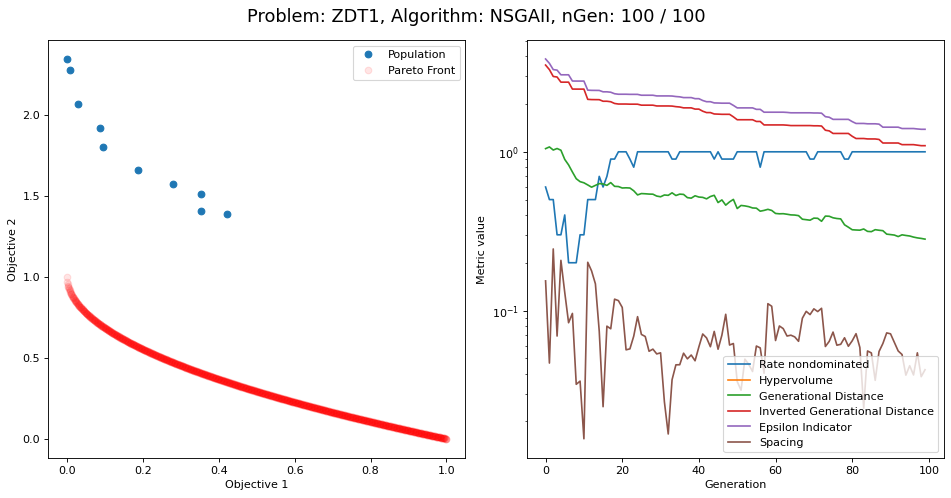

In [ ]:
# ------- Name of problem -------
name_problem = 'ZDT1'
# name_problem = 'DTLZ2'
# name_problem = 'WFG2'

# ------- Name of algorithm ---------
name_algorithm = 'NSGAII'
# name_algorithm = 'CMAES'
# name_algorithm = 'GDE3'
# name_algorithm = 'IBEA'
# name_algorithm = 'MOEAD'
# name_algorithm = 'NSGAIII'

# ------ Some simulation parameters ---------
number_generations = 100
show_results_every = 10
population_size = 10

# ----- Database ----------------
problem, PF_array, PF_pltyp = problem_plus_paretofront(name_problem)

# ----- Algorithm ---------------
perf_so_far = InternalMetrics(reference_set=PF_pltyp)
if name_algorithm == 'NSGAIII':
    algorithm = locals()[name_algorithm](problem, population_size=population_size, divisions_outer=12)
else:
    algorithm = locals()[name_algorithm](problem, population_size=population_size)

# -------- Loop MO -------
fig = plt.figure(figsize=(12,6), dpi=80)

if problem.nobjs==2:
    ax1 = fig.add_subplot(1, 2, 1)
elif problem.nobjs==3:
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2)

arg_ax1 ={}
for ii in tqdm_notebook(range(number_generations), desc='Generation'):
    algorithm.run(1, callback=perf_so_far.calc)
    if (ii == 0) or (ii%show_results_every==0) or (ii == number_generations-1):
        sqw = np.array(perf_so_far.metrics)
        gen = np.arange(sqw.shape[0])
        # -- plot population so far and pareto front
        ax1.clear()
        if problem.nobjs==2:
            ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],marker='o',linestyle='',label='Population')
            ax1.plot(PF_array[:,0],PF_array[:,1],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
        elif problem.nobjs==3:
            ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],
                     perf_so_far.population[ii][:,2],marker='o',linestyle='',label='Population')
            ax1.plot(PF_array[:,0],PF_array[:,1],PF_array[:,2],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
            ax1.set_zlabel('Objective 3')
            ax1.view_init(elev=30.0, azim=15.0)
        ax1.set_xlabel('Objective 1')
        ax1.set_ylabel('Objective 2')
        ax1.legend()
        # --- plot MO indicators ---
        ax2.clear()
        ax2.plot(gen, sqw[:,0]/sqw[:,1], label='Rate nondominated')
        ax2.plot(gen, sqw[:,2], label='Hypervolume')
        ax2.plot(gen, sqw[:,3], label='Generational Distance')
        ax2.plot(gen, sqw[:,4], label='Inverted Generational Distance')
        ax2.plot(gen, sqw[:,5], label='Epsilon Indicator')
        ax2.plot(gen, sqw[:,6], label='Spacing')

        ax2.set_xlabel('Generation')
        ax2.set_ylabel('Metric value')
        ax2.set_yscale('log')
        ax2.legend()
        fig.suptitle('Problem: %s, Algorithm: %s, nGen: %d / %d'%(name_problem, name_algorithm, ii+1, number_generations), y=0.83, fontsize=16)
        fig.tight_layout(rect=[0, -0.2, 1, 0.85])  # Añadir esta línea

        # fig.canvas.draw()
        # fig.canvas.flush_events()

In [9]:
plt.figure()
plt.plot(gen, sqw[:,0]/sqw[:,1], label='Rate nondominated')
plt.plot(gen, sqw[:,2], label='Hypervolume')
plt.plot(gen, sqw[:,3], label='Generational Distance')
plt.plot(gen, sqw[:,4], label='Inverted Generational Distance')
plt.plot(gen, sqw[:,5], label='Epsilon Indicator')
plt.plot(gen, sqw[:,6], label='Spacing')
plt.legend()
plt.show()

NameError: name 'gen' is not defined

<Figure size 640x480 with 0 Axes>

# 2.a) Función para ejecutar todos los cáclulos automáticamente

In [ ]:
def atm_MOEA(name_problem, name_algorithm, number_generations, population_size):

    # print(type(name_problem), type(name_algorithm), type(number_generations), type(population_size))

    folder = f'graphs/{name_problem}/{name_algorithm}'
    os.makedirs(folder, exist_ok=True)

    show_results_every = 10

    # ----- Database ----------------
    problem, PF_array, PF_pltyp = problem_plus_paretofront(name_problem)

    # ----- Algorithm ---------------
    perf_so_far = InternalMetrics(reference_set=PF_pltyp)
    # print('bien')
    if name_algorithm == 'NSGAIII':
        algorithm = globals()[name_algorithm](problem, population_size=population_size, divisions_outer=12)
    else:
        algorithm = globals()[name_algorithm](problem, population_size=population_size)
        print(algorithm)

    # -------- Loop MO -------
    fig = plt.figure(figsize=(12,6), dpi=80)

    if problem.nobjs==2:
        ax1 = fig.add_subplot(1, 2, 1)
    elif problem.nobjs==3:
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax2 = fig.add_subplot(1, 2, 2)

    arg_ax1 ={}

    print('#####################################################')
    print(f'# Problema: {name_problem}, Algoritmo: {name_algorithm}')
    print('#####################################################')

    for ii in tqdm_notebook(range(number_generations), desc='Generation'):
        algorithm.run(1, callback=perf_so_far.calc)
        if (ii == 0) or (ii%show_results_every==0) or (ii == number_generations-1):
            sqw = np.array(perf_so_far.metrics)
            gen = np.arange(sqw.shape[0])
            # -- plot population so far and pareto front
            ax1.clear()
            if problem.nobjs==2:
                ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],marker='o',linestyle='',label='Population')
                ax1.plot(PF_array[:,0],PF_array[:,1],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
            elif problem.nobjs==3:
                ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],
                        perf_so_far.population[ii][:,2],marker='o',linestyle='',label='Population')
                ax1.plot(PF_array[:,0],PF_array[:,1],PF_array[:,2],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
                ax1.set_zlabel('Objective 3')
                ax1.view_init(elev=30.0, azim=15.0)
            ax1.set_xlabel('Objective 1')
            ax1.set_ylabel('Objective 2')
            ax1.legend()
            # --- plot MO indicators ---
            ax2.clear()
            ax2.plot(gen, sqw[:,0]/sqw[:,1], label='Rate nondominated')
            ax2.plot(gen, sqw[:,2], label='Hypervolume')
            ax2.plot(gen, sqw[:,3], label='Generational Distance')
            ax2.plot(gen, sqw[:,4], label='Inverted Generational Distance')
            ax2.plot(gen, sqw[:,5], label='Epsilon Indicator')
            ax2.plot(gen, sqw[:,6], label='Spacing')

            ax2.set_xlabel('Generation')
            ax2.set_ylabel('Metric value')
            ax2.set_yscale('log')
            ax2.legend()
            fig.suptitle('Problem: %s, Algorithm: %s, nGen: %d / %d'%(name_problem, name_algorithm, ii+1, number_generations), y=0.83, fontsize=16)
            fig.tight_layout(rect=[0, -0.2, 1, 0.85])  # Añadir esta línea
            plt.savefig(fname=f'{folder}/results.pdf', bbox_inches='tight', pad_inches=0.5)  # Añade padding extra
            # plt.show()
            # fig.canvas.draw()
            # fig.canvas.flush_events()

# Ejecución de todos los cálculos (1)
Problemas - > ['ZDT1', 'DTLZ2', 'WFG2']

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

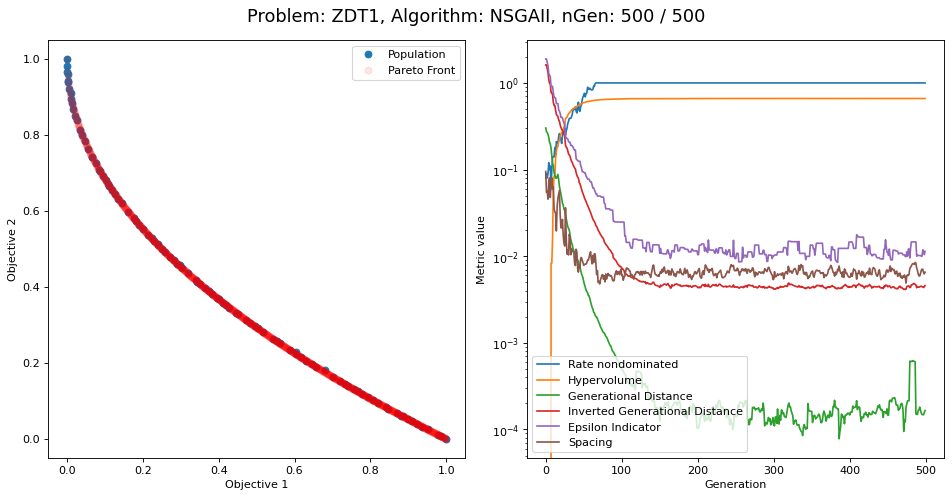

#####################################################
# Problema: ZDT1, Algoritmo: CMAES
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

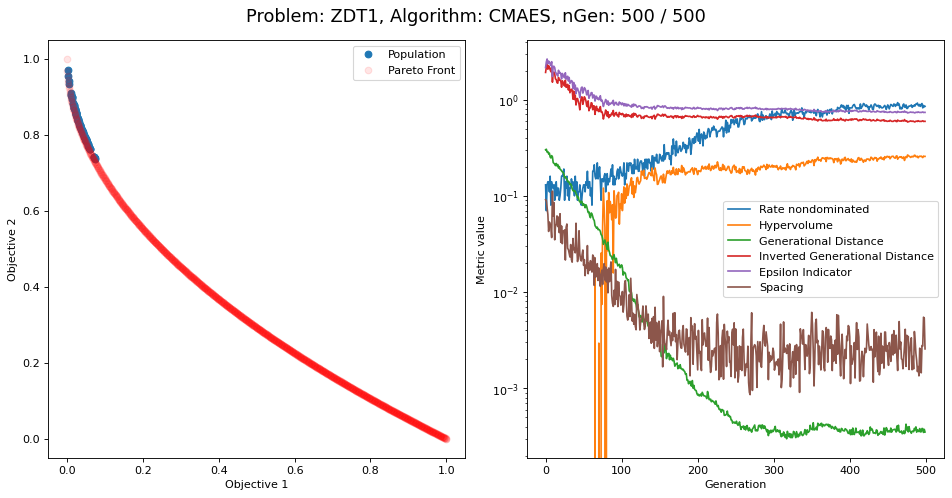

#####################################################
# Problema: ZDT1, Algoritmo: GDE3
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

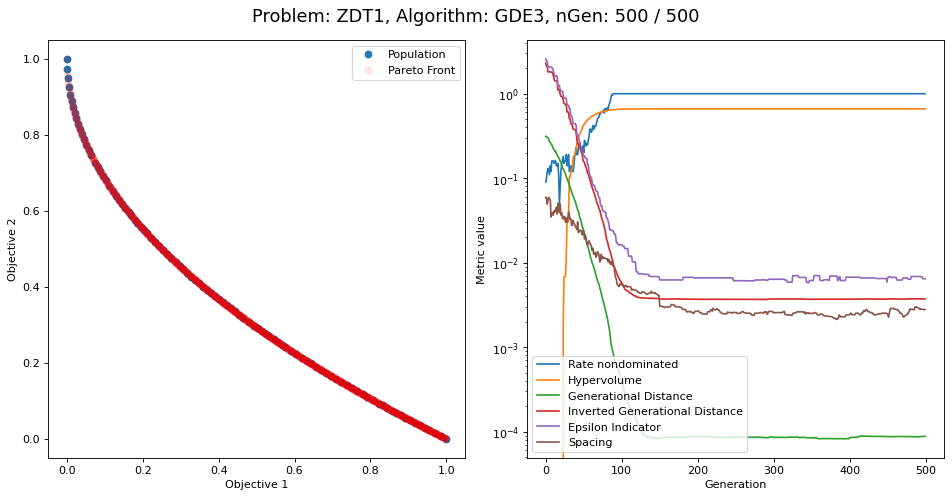

#####################################################
# Problema: ZDT1, Algoritmo: IBEA
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

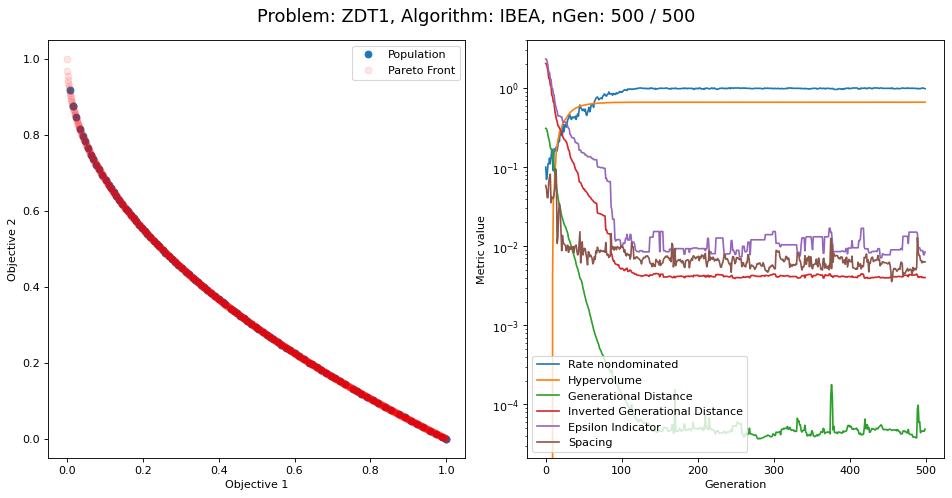

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

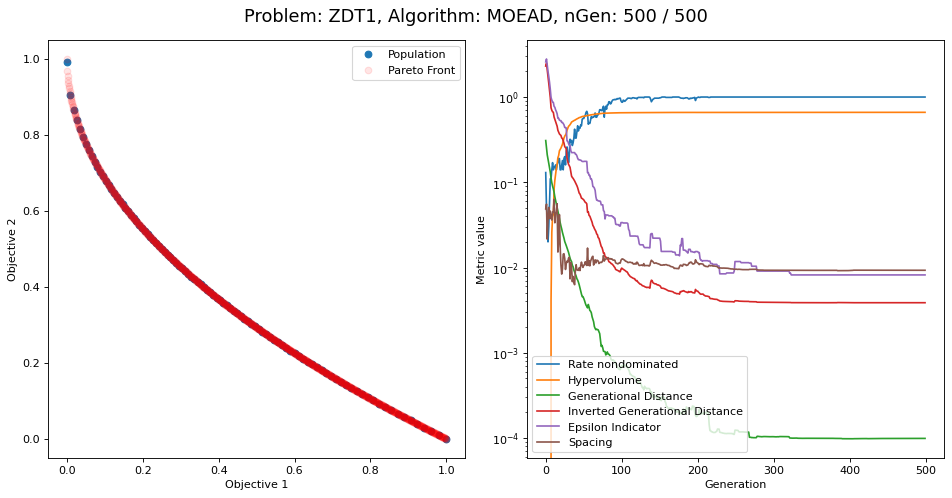

#####################################################
# Problema: ZDT1, Algoritmo: NSGAIII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

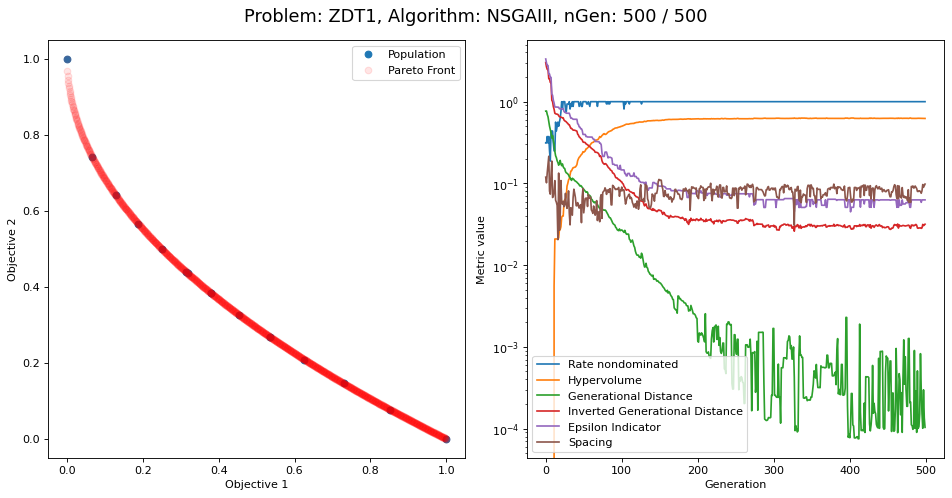

#####################################################
# Problema: DTLZ2, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

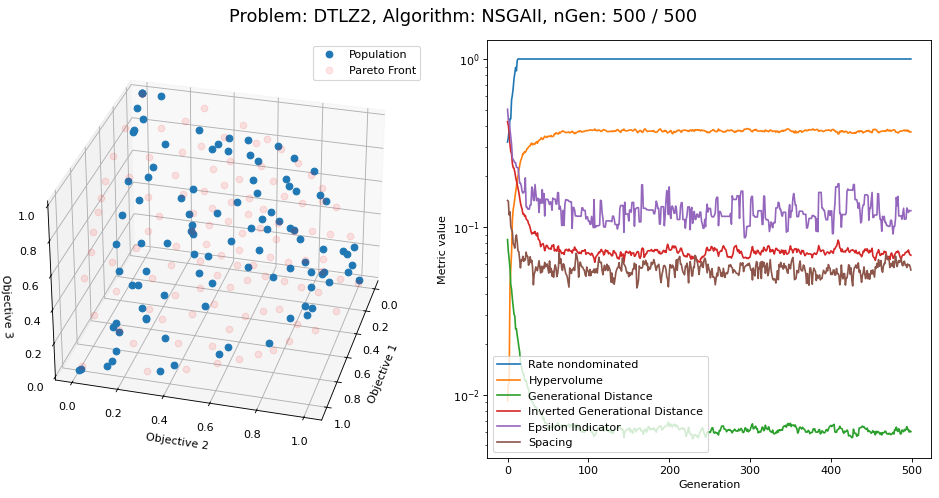

#####################################################
# Problema: DTLZ2, Algoritmo: CMAES
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

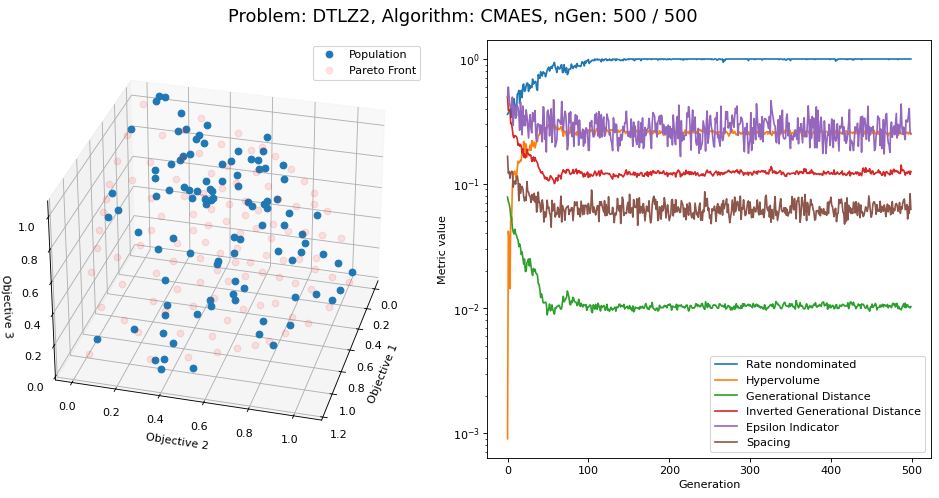

#####################################################
# Problema: DTLZ2, Algoritmo: GDE3
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

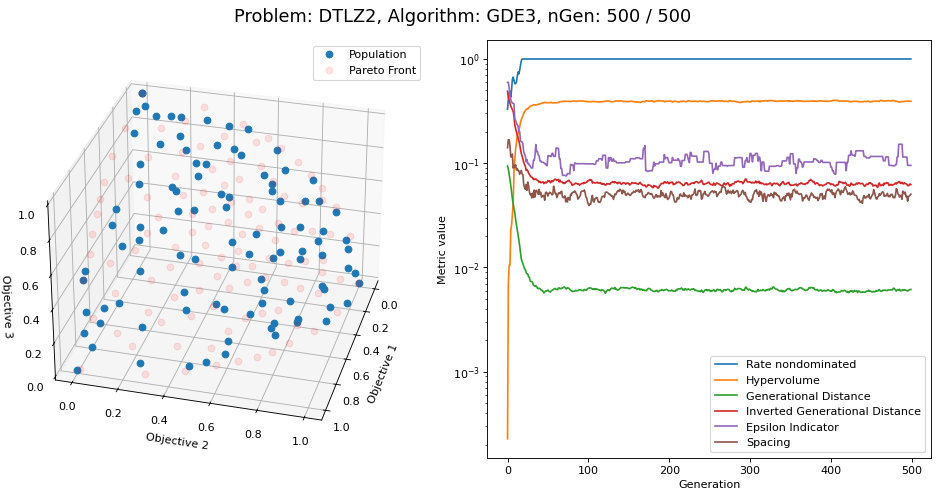

#####################################################
# Problema: DTLZ2, Algoritmo: IBEA
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

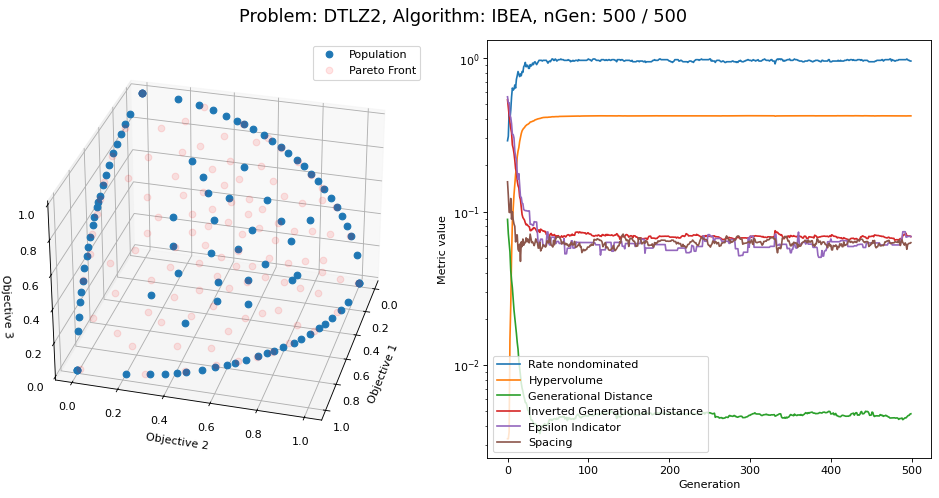

#####################################################
# Problema: DTLZ2, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

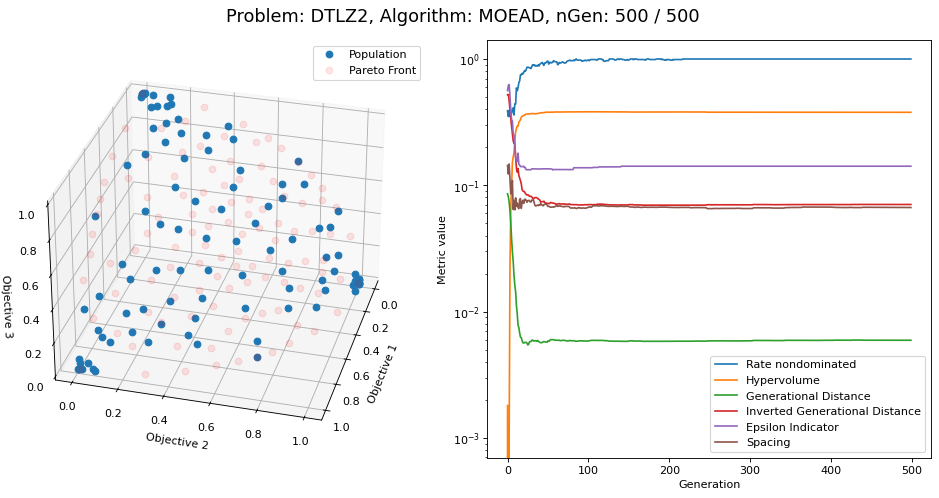

#####################################################
# Problema: DTLZ2, Algoritmo: NSGAIII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

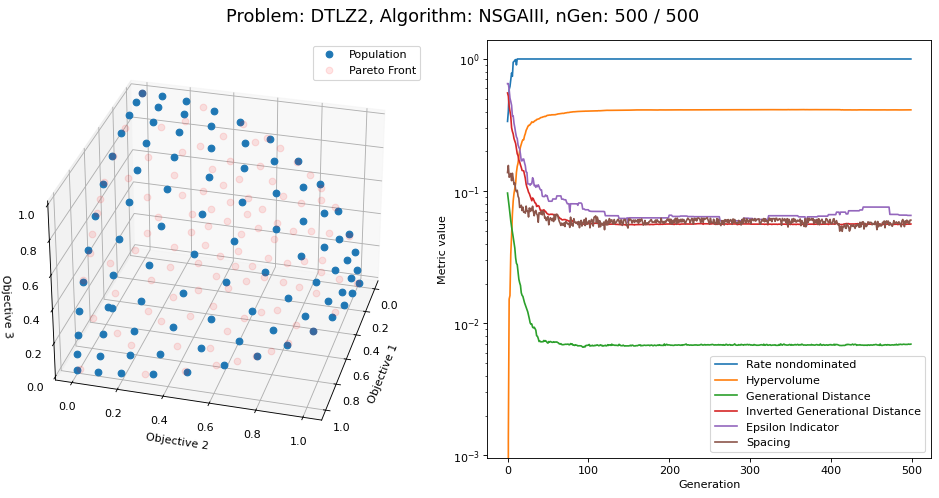

#####################################################
# Problema: WFG2, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

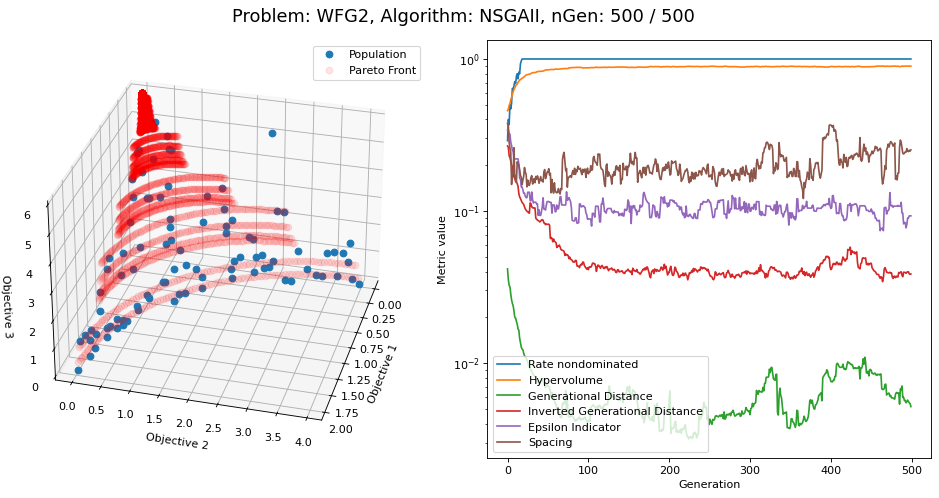

#####################################################
# Problema: WFG2, Algoritmo: CMAES
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

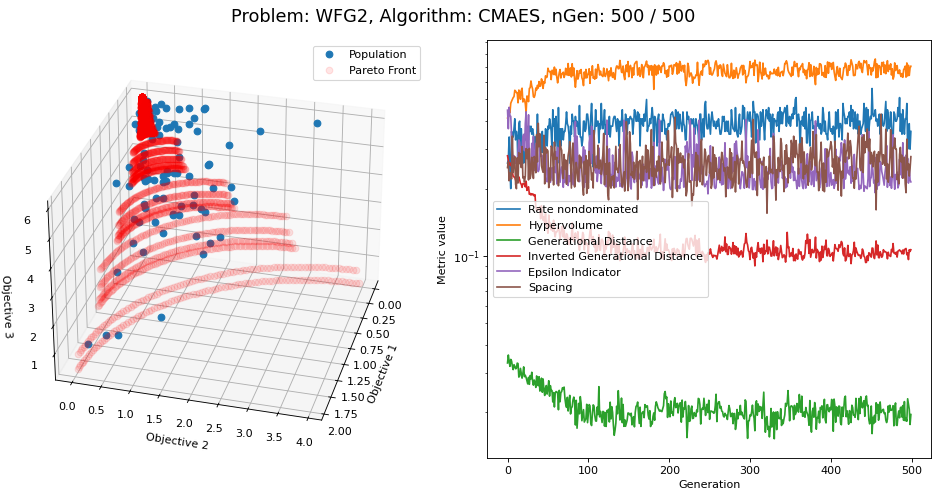

#####################################################
# Problema: WFG2, Algoritmo: GDE3
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

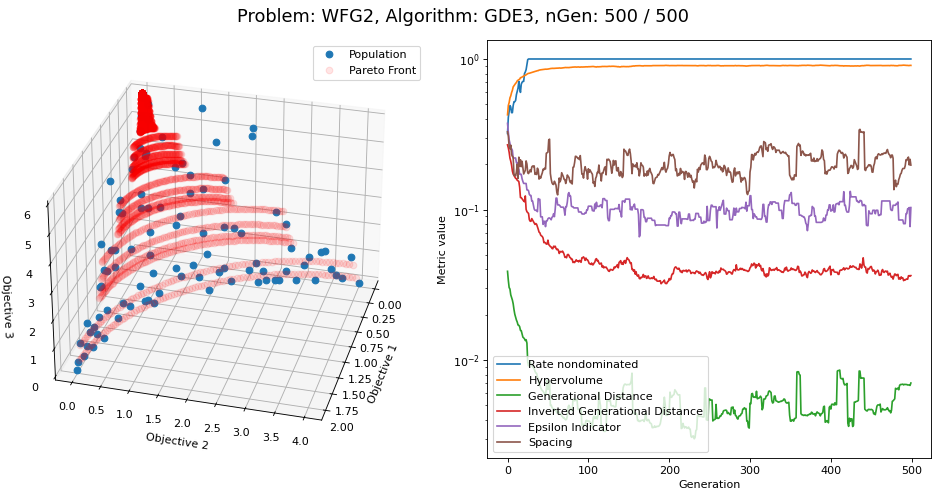

#####################################################
# Problema: WFG2, Algoritmo: IBEA
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

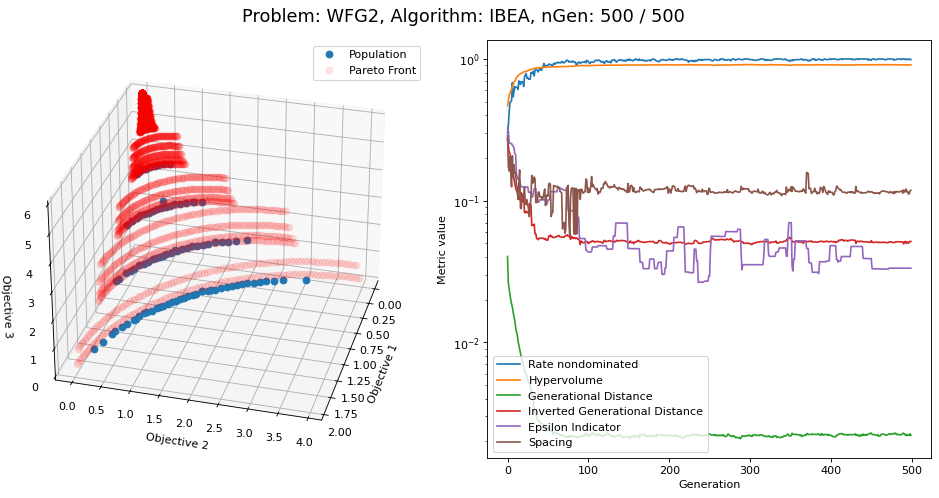

#####################################################
# Problema: WFG2, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

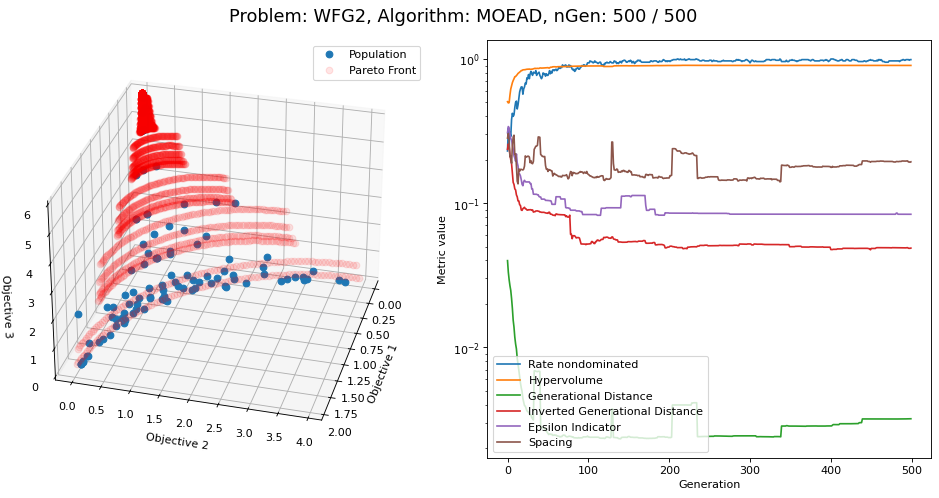

#####################################################
# Problema: WFG2, Algoritmo: NSGAIII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

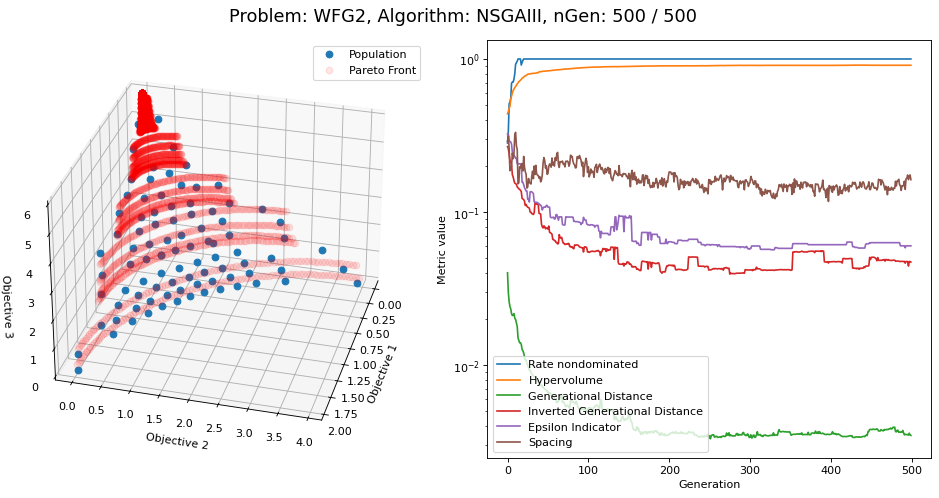

In [ ]:
name_problems = ['ZDT1', 'DTLZ2', 'WFG2']
name_algorithms = ['NSGAII', 'CMAES', 'GDE3', 'IBEA', 'MOEAD', 'NSGAIII']

for problem in name_problems:
  for algorithm in name_algorithms:
    atm_MOEA(name_problem=problem, name_algorithm=algorithm, number_generations=500, population_size=100)
    plt.show()

# Ejecución de todos los cálculos (2)

<!-- ## Crear problema con restricciones -->

CONSTR problem:
\begin{align}
\min\, & \left(x_1\,,\,(1+x_2)/x_1\right)\\
s.t: &\, 9x_1+x_2\geq6\\
 & 9x_1-x_2\geq1
\end{align}

donde $x\in[0.1,1]$, $y\in[0,0.5]$


In [10]:
from platypus import NSGAII, Problem, Real

class CONSTR(Problem):
    def __init__(self):
        super(CONSTR, self).__init__(2, 2, 2)   # dos variables, dos objetivos, dos restricciones
        self.types[:] = [Real(0.1, 1), Real(0, 0.5)]   # limites de las variables x,y
        self.constraints[:] = ">=0"                # Tipo de restriccion

    def evaluate(self, solution):
        x1 = solution.variables[0]
        x2 = solution.variables[1]
        solution.objectives[:] = [x1, (1+x2)/x1]
        solution.constraints[:] = [9*x1 + x2 - 6, 9*x1 - x2 - 1]


problem_constr = CONSTR

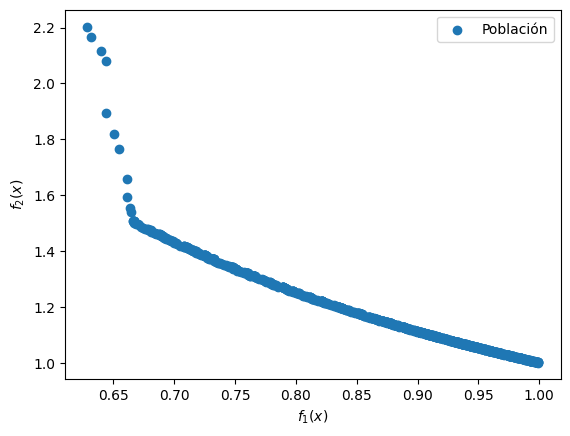

In [12]:
from platypus import CMAES, GDE3, IBEA, MOEAD, NSGAIII
algorithm = CMAES(CONSTR(), population_size=100, divisions_outer=12)
algorithm.run(10000)

# Plot the results using matplotlib
plt.scatter([s.objectives[0] for s in algorithm.result],
            [s.objectives[1] for s in algorithm.result], label='Población')
# plt.xlim([0.1, 1])
# plt.ylim([0, 0.5])
plt.xlabel("$f_1(x)$")
plt.ylabel("$f_2(x)$")
plt.legend()
plt.show()

SRN problem:
\begin{align}
\min\, & \left((x_1-2)^2+(x_2-1)^2+2\,,\,9x_1-(x_2-1)^2\right)\\
s.t: &\, x_1^2+x_2^2\leq225\\
 & x_1-3x_2\leq-10
\end{align}

donde $x\in[-20,20]$, $y\in[-20,20]$


In [13]:
from platypus import Problem, Real

class SRN(Problem):
    def __init__(self):
        super(SRN, self).__init__(2, 2, 2)   # dos variables, dos objetivos, dos restricciones
        self.types[:] = [Real(-20, 20), Real(-20, 20)]   # limites de las variables x,y
        self.constraints[:] = "<=0"                # Tipo de restriccion

    def evaluate(self, solution):
        x1 = solution.variables[0]
        x2 = solution.variables[1]
        solution.objectives[:] = [(x1-2)**2+(x2-1)**2+2, 9*x1-(x2-1)**2+2]
        solution.constraints[:] = [x1**2 + x1**2 - 225, x1 - 3*x2 + 10]


problem_srn = SRN

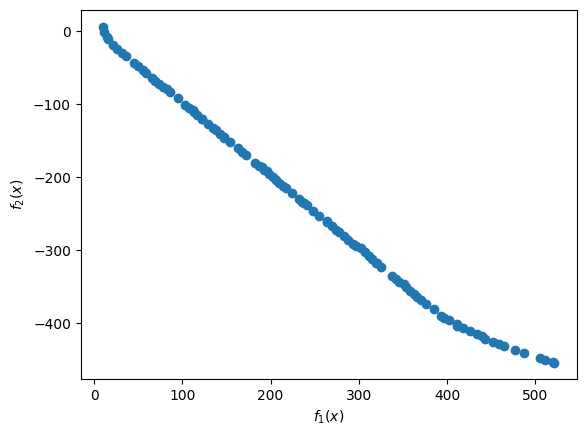

In [14]:
from platypus import NSGAII, CMAES, GDE3, IBEA, MOEAD, NSGAIII
algorithm = NSGAII(SRN(), population_size=100, divisions_outer=12)
algorithm.run(10000)

# Plot the results using matplotlib
plt.scatter([s.objectives[0] for s in algorithm.result],
            [s.objectives[1] for s in algorithm.result])
# plt.xlim([0.1, 1])
# plt.ylim([0, 0.5])
plt.xlabel("$f_1(x)$")
plt.ylabel("$f_2(x)$")
plt.show()

# 2.b) Grid Search para encontrar la mejor configuración

In [ ]:
from platypus import SBX, PM, CompoundOperator

def atm_MOEA_grid_search(name_problem, name_algorithm, number_generations, population_size, mutation_prob, crossover_prob):

    # folder = f'graphs/{name_problem}/{name_algorithm}'
    # os.makedirs(folder, exist_ok=True)

    show_results_every = 10

    # ----- Database ----------------
    problem, PF_array, PF_pltyp = problem_plus_paretofront(name_problem)

    # ----- Algorithm ---------------
    perf_so_far = InternalMetrics(reference_set=PF_pltyp)

    # ----- Variador ---------------
    # Crossover SBX
    crossover = SBX(probability=crossover_prob, distribution_index=20)

    # Mutación polinomial
    mutation = PM(probability=mutation_prob, distribution_index=20)

    # Combinarlos en un solo variador
    variator = CompoundOperator(crossover, mutation)

    if name_algorithm == 'NSGAII':
        algorithm = globals()[name_algorithm](problem, population_size=population_size, variator=variator)
    else:
        algorithm = globals()[name_algorithm](problem, population_size=population_size, variator=variator)

    # -------- Loop MO -------
    # fig = plt.figure(figsize=(12,6), dpi=80)

    # if problem.nobjs==2:
    #     ax1 = fig.add_subplot(1, 2, 1)
    # elif problem.nobjs==3:
    #     ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    # ax2 = fig.add_subplot(1, 2, 2)

    arg_ax1 ={}

    print('#####################################################')
    print(f'# Problema: {name_problem}, Algoritmo: {name_algorithm}')
    print('#####################################################')

    for ii in tqdm_notebook(range(number_generations), desc='Generation'):
        algorithm.run(1, callback=perf_so_far.calc)
        if (ii == 0) or (ii%show_results_every==0) or (ii == number_generations-1):
            sqw = np.array(perf_so_far.metrics)
            # gen = np.arange(sqw.shape[0])
            # # -- plot population so far and pareto front
            # ax1.clear()
            # if problem.nobjs==2:
            #     ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],marker='o',linestyle='',label='Population')
            #     ax1.plot(PF_array[:,0],PF_array[:,1],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
            # elif problem.nobjs==3:
            #     ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],
            #             perf_so_far.population[ii][:,2],marker='o',linestyle='',label='Population')
            #     ax1.plot(PF_array[:,0],PF_array[:,1],PF_array[:,2],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
            #     ax1.set_zlabel('Objective 3')
            #     ax1.view_init(elev=30.0, azim=15.0)
            # ax1.set_xlabel('Objective 1')
            # ax1.set_ylabel('Objective 2')
            # ax1.legend()
            # # --- plot MO indicators ---
            # ax2.clear()
            # ax2.plot(gen, sqw[:,0]/sqw[:,1], label='Rate nondominated')
            # ax2.plot(gen, sqw[:,2], label='Hypervolume')
            # ax2.plot(gen, sqw[:,3], label='Generational Distance')
            # ax2.plot(gen, sqw[:,4], label='Inverted Generational Distance')
            # ax2.plot(gen, sqw[:,5], label='Epsilon Indicator')
            # ax2.plot(gen, sqw[:,6], label='Spacing')

            # ax2.set_xlabel('Generation')
            # ax2.set_ylabel('Metric value')
            # ax2.set_yscale('log')
            # ax2.legend()
            # fig.suptitle('Problem: %s, Algorithm: %s, nGen: %d / %d'%(name_problem, name_algorithm, ii+1, number_generations), y=0.83, fontsize=16)
            # fig.tight_layout(rect=[0, -0.2, 1, 0.85])  # Añadir esta línea
            # plt.savefig(fname=f'{folder}/results.pdf', bbox_inches='tight', pad_inches=0.5)  # Añade padding extra
            # # plt.show()
            # # fig.canvas.draw()
            # # fig.canvas.flush_events()
    return sqw

Configuración: Population size=100, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

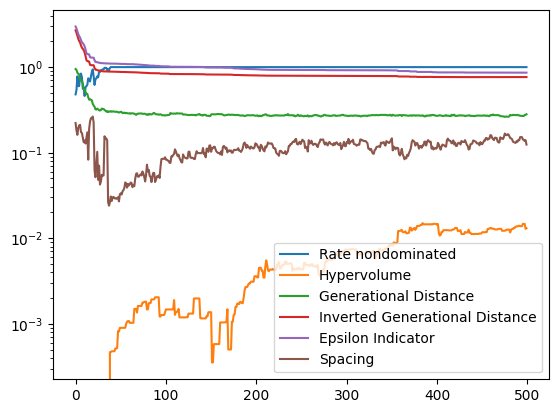

Configuración: Population size=100, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

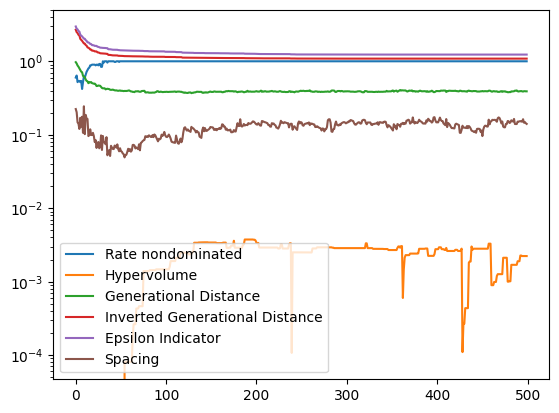

Configuración: Population size=100, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

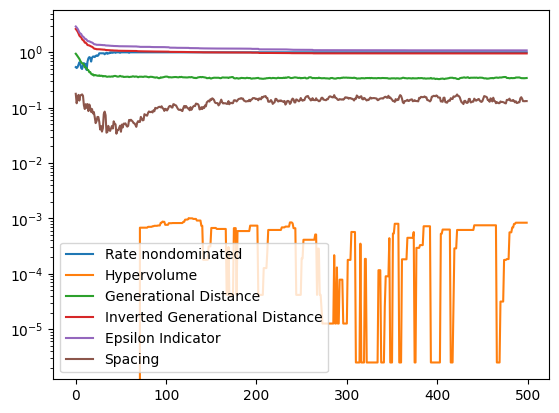

Configuración: Population size=100, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

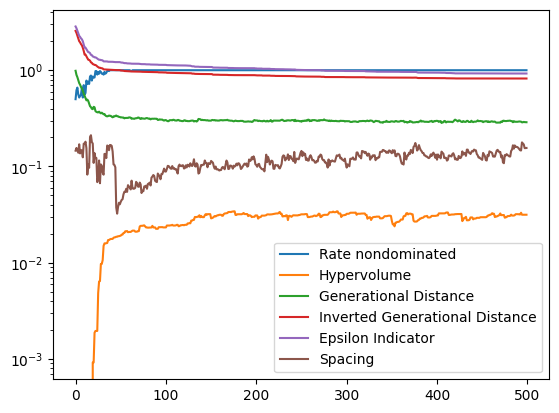

Configuración: Population size=100, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

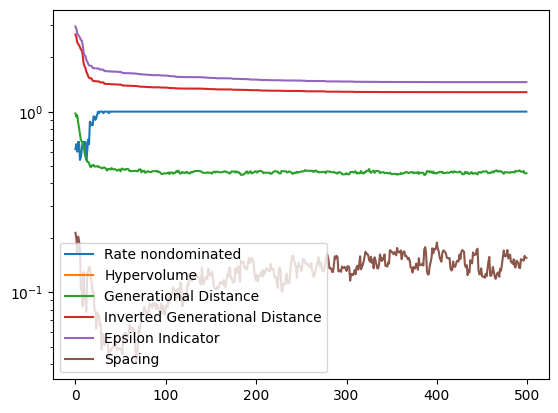

Configuración: Population size=100, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

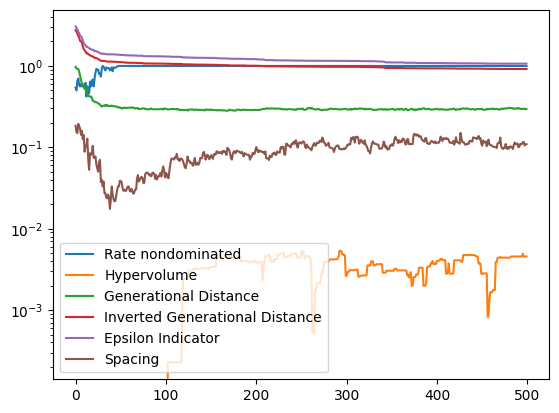

Configuración: Population size=100, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

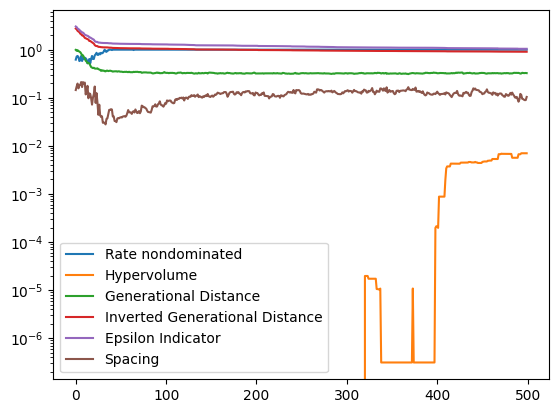

Configuración: Population size=100, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

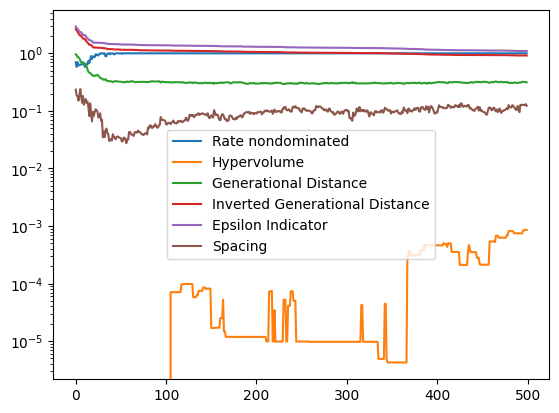

Configuración: Population size=100, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

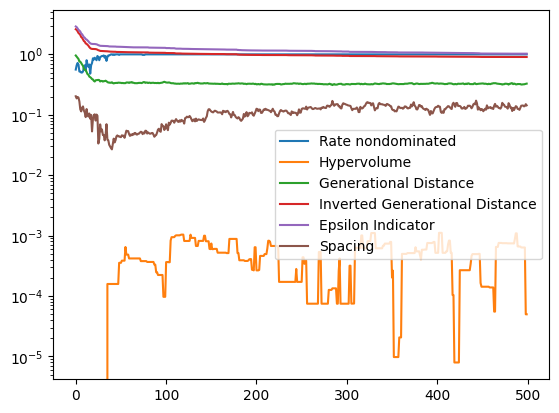

Configuración: Population size=200, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

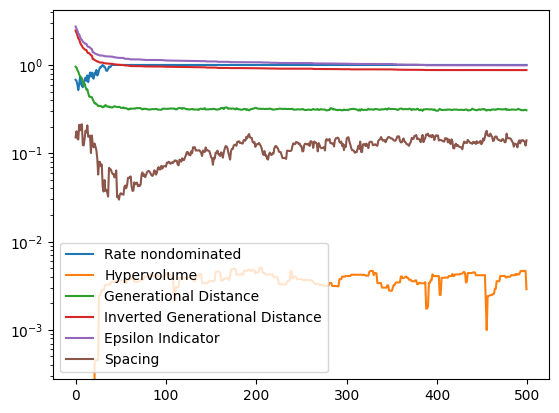

Configuración: Population size=200, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

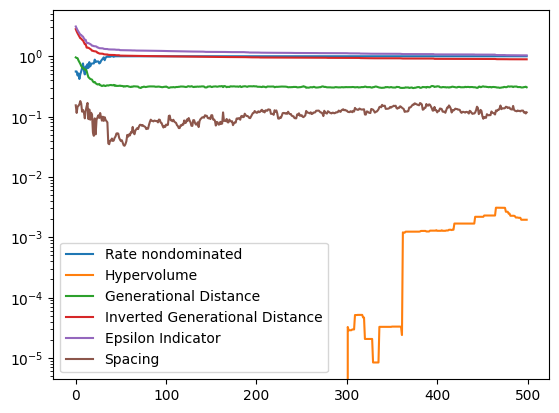

Configuración: Population size=200, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

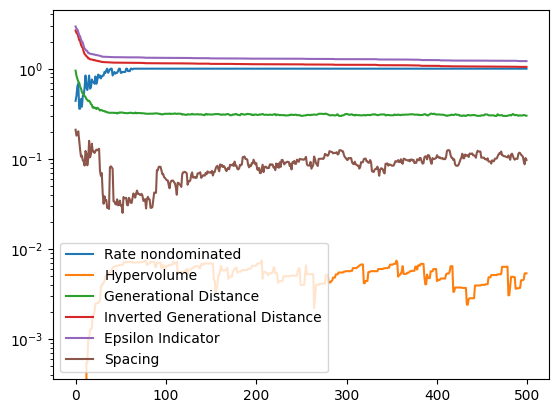

Configuración: Population size=200, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

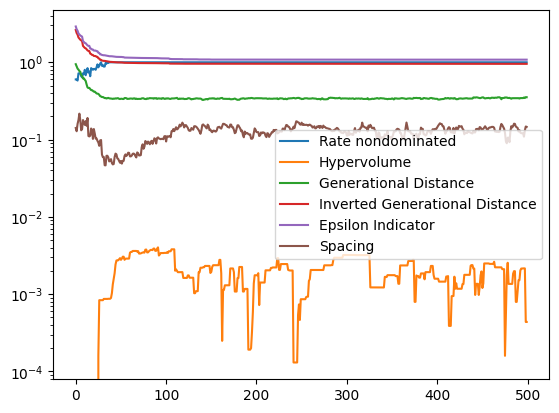

Configuración: Population size=200, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

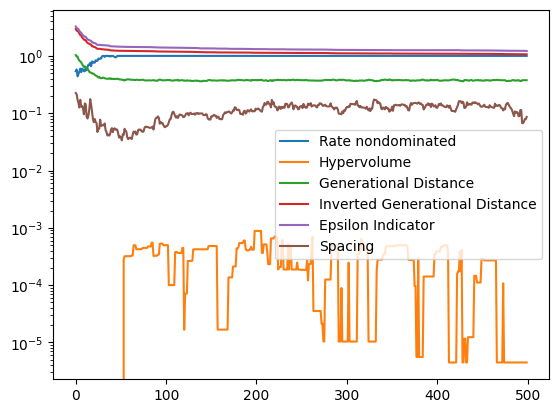

Configuración: Population size=200, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

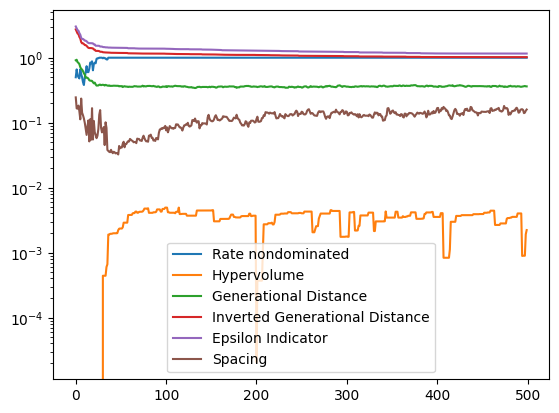

Configuración: Population size=200, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

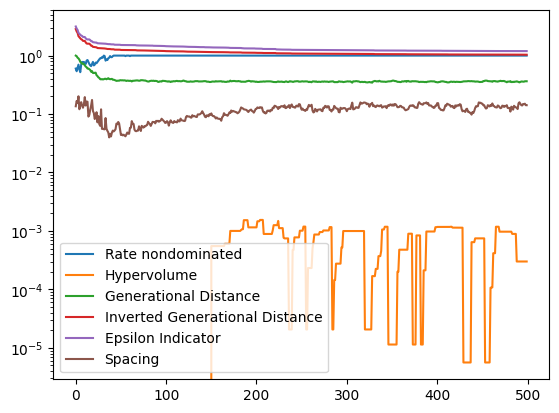

Configuración: Population size=200, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

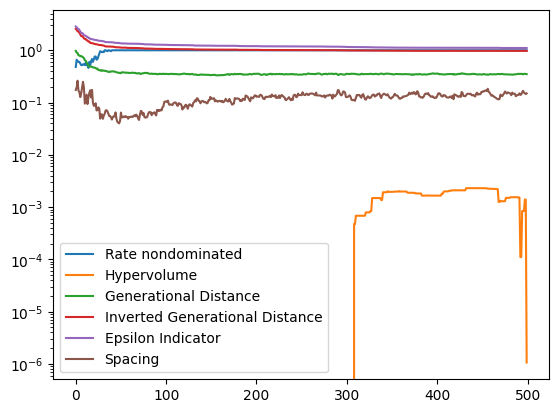

Configuración: Population size=200, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

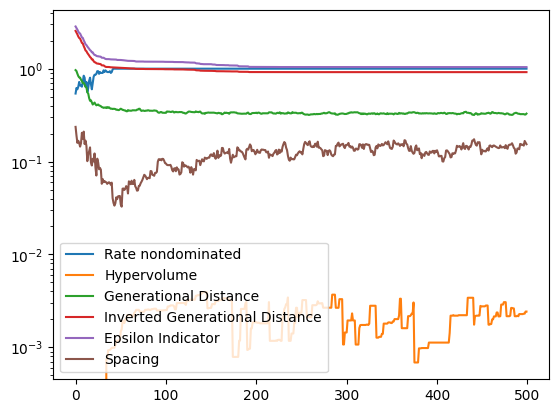

Configuración: Population size=500, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

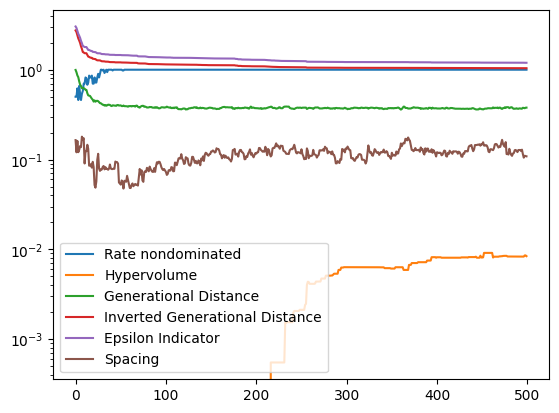

Configuración: Population size=500, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

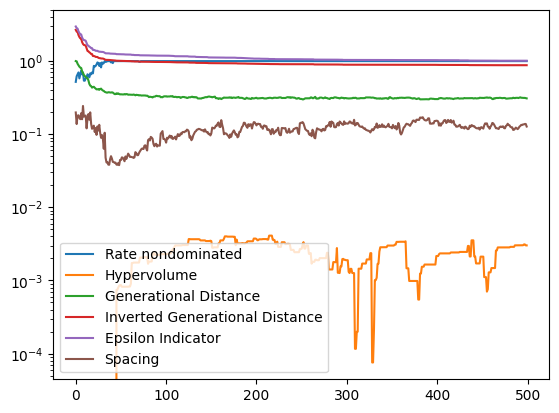

Configuración: Population size=500, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

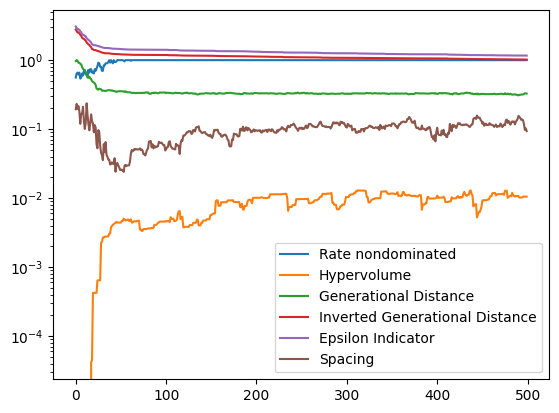

Configuración: Population size=500, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

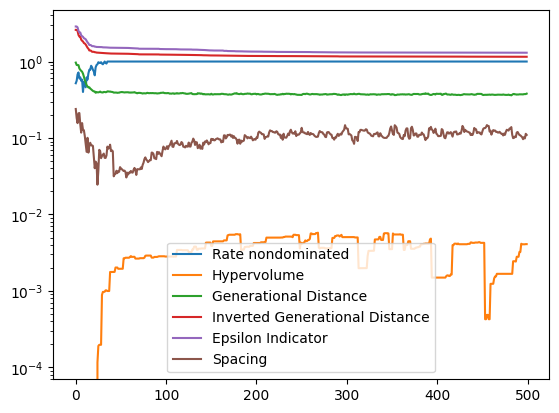

Configuración: Population size=500, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

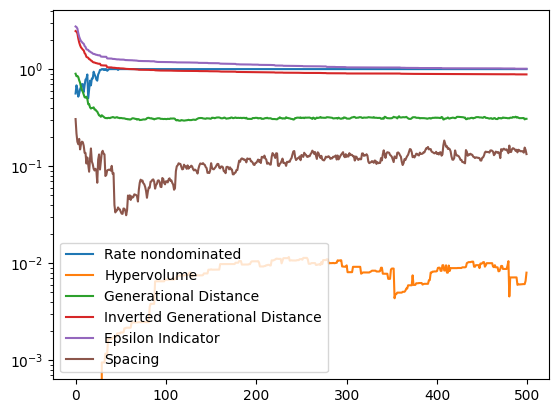

Configuración: Population size=500, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

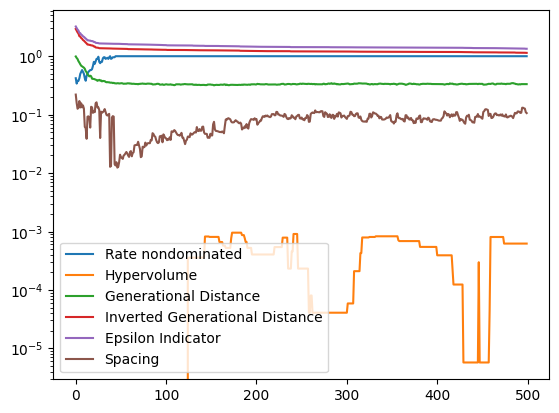

Configuración: Population size=500, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

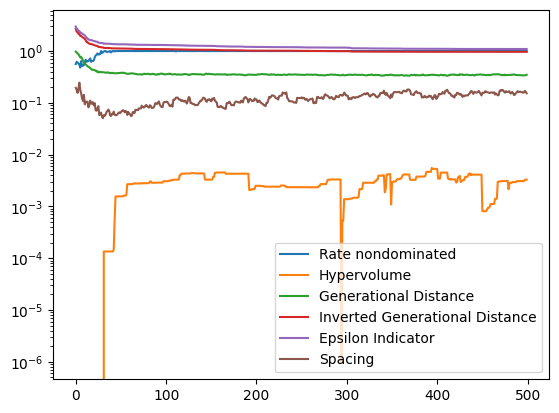

Configuración: Population size=500, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

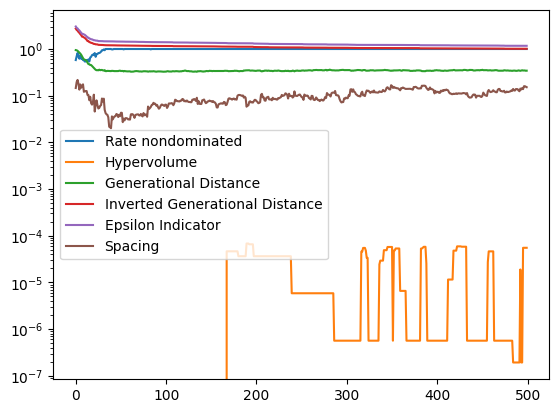

Configuración: Population size=500, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

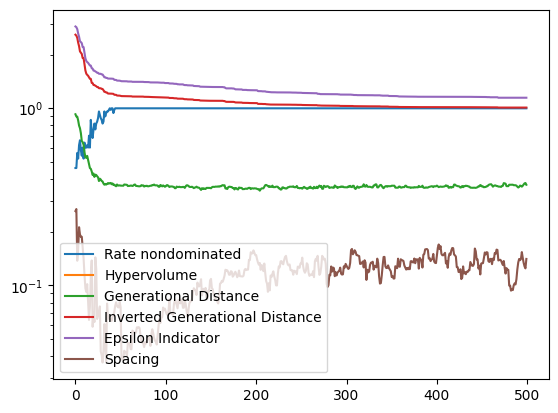

Configuración: Population size=100, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

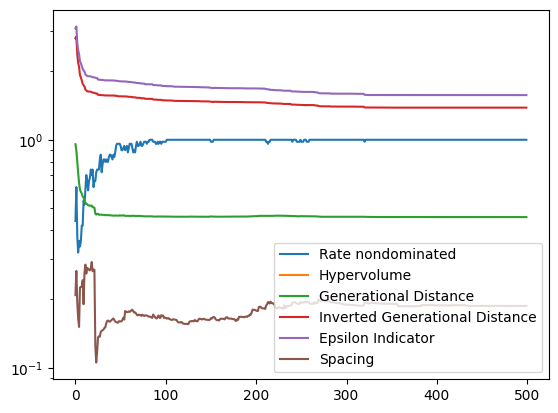

Configuración: Population size=100, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

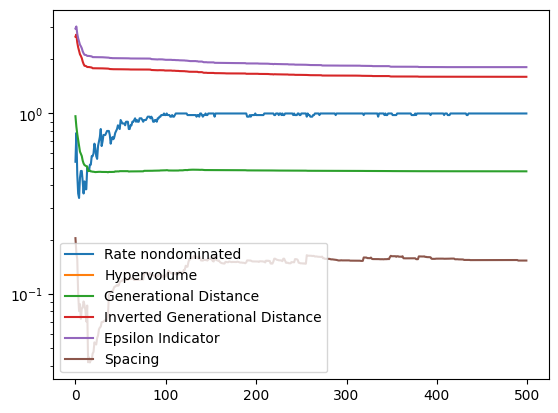

Configuración: Population size=100, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

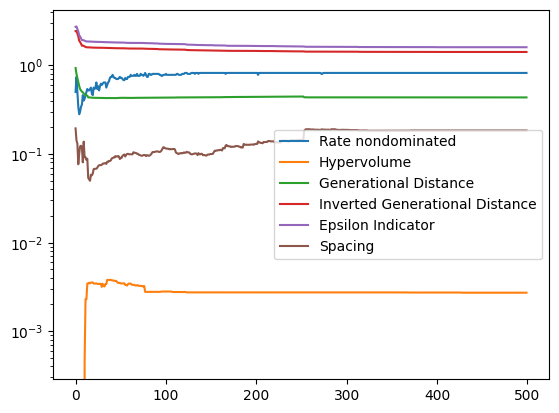

Configuración: Population size=100, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

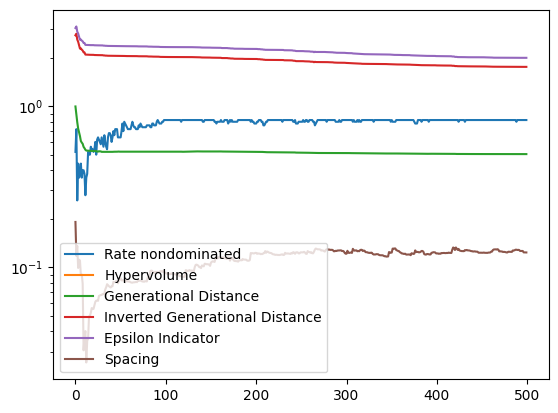

Configuración: Population size=100, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

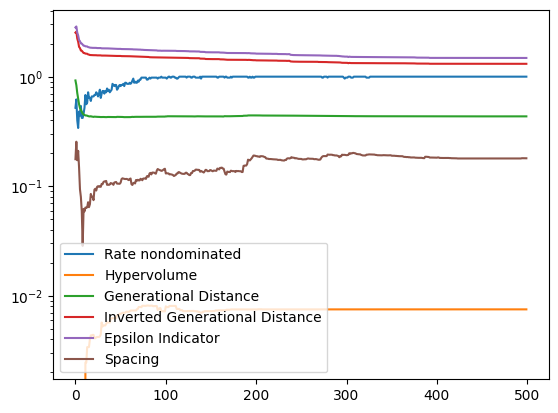

Configuración: Population size=100, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

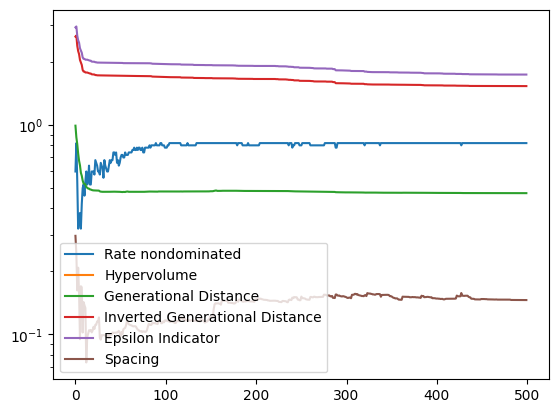

Configuración: Population size=100, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

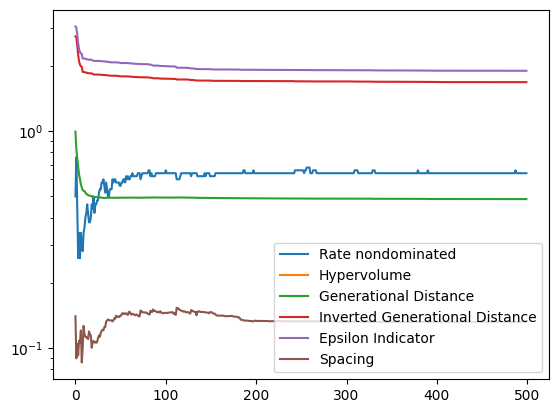

Configuración: Population size=100, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

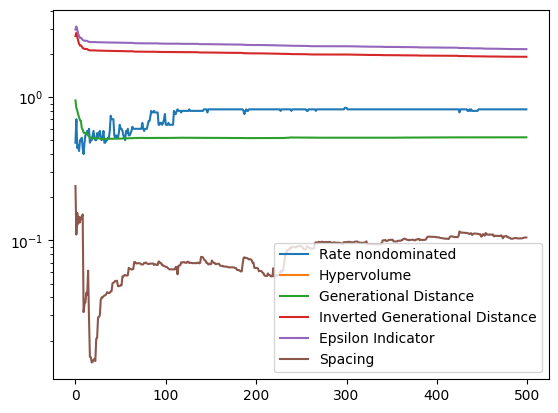

Configuración: Population size=100, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

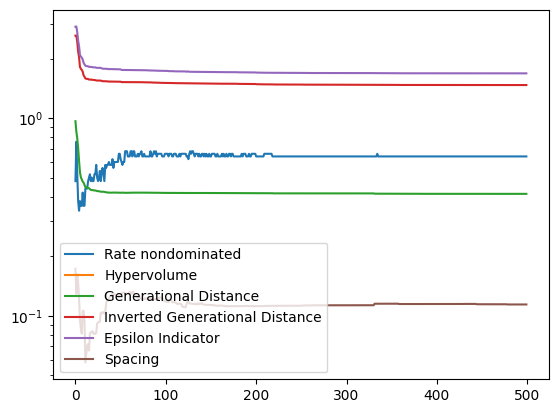

Configuración: Population size=200, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

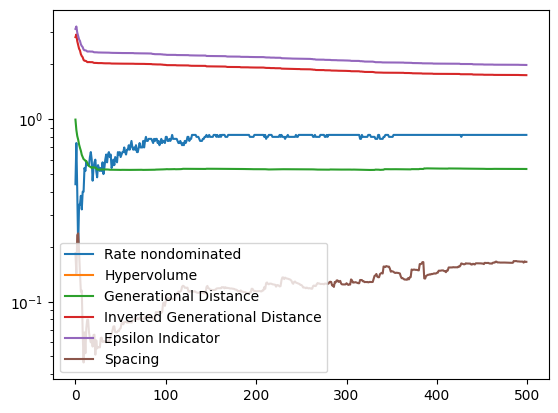

Configuración: Population size=200, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

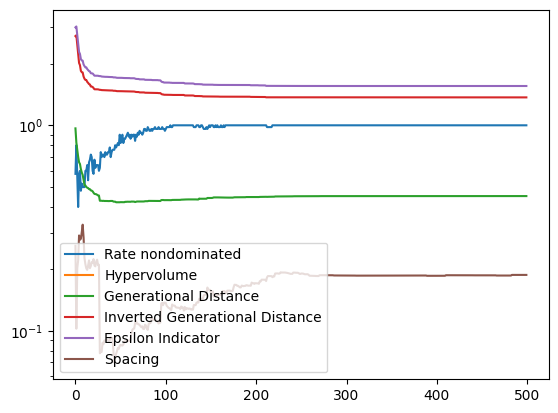

Configuración: Population size=200, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

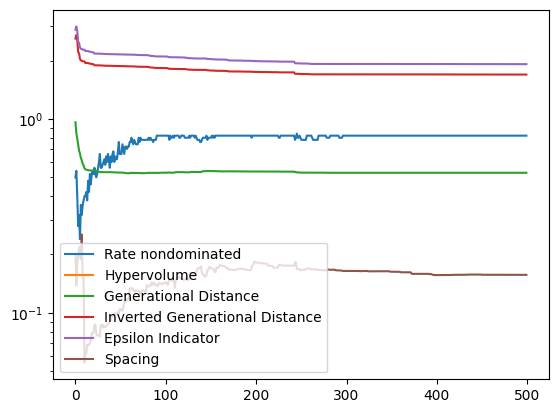

Configuración: Population size=200, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

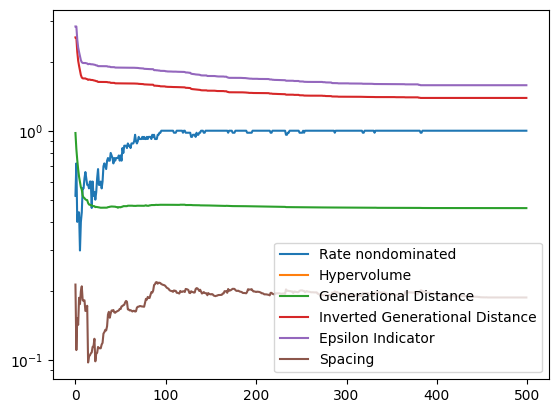

Configuración: Population size=200, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

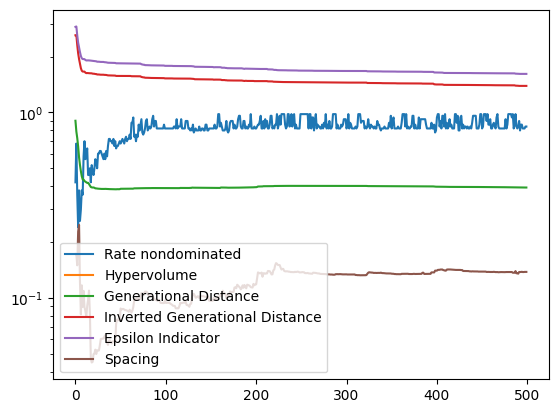

Configuración: Population size=200, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

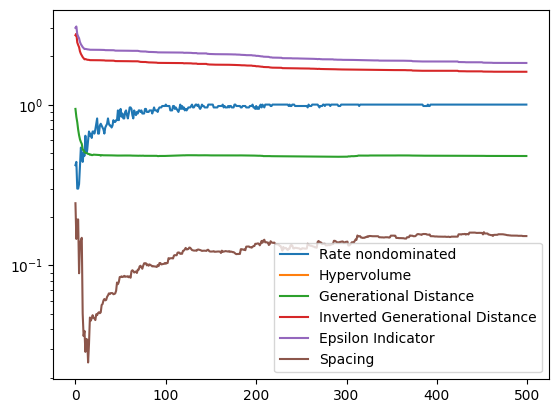

Configuración: Population size=200, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

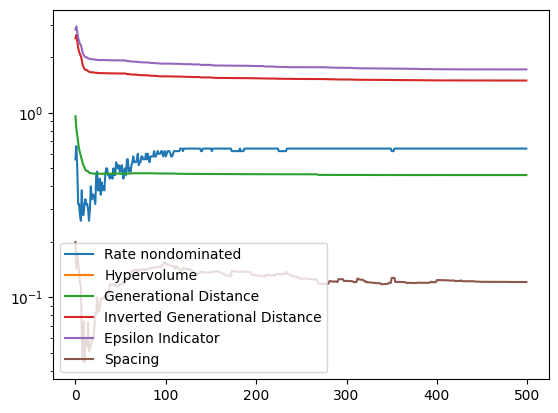

Configuración: Population size=200, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

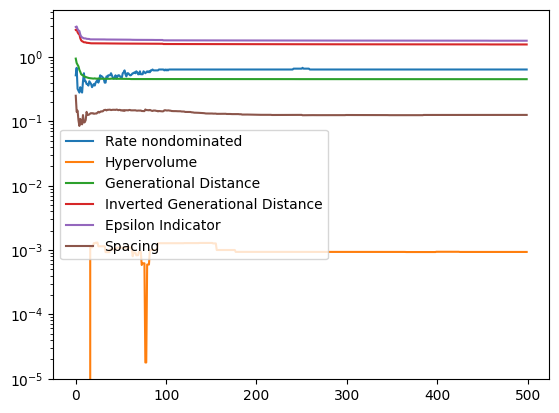

Configuración: Population size=200, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

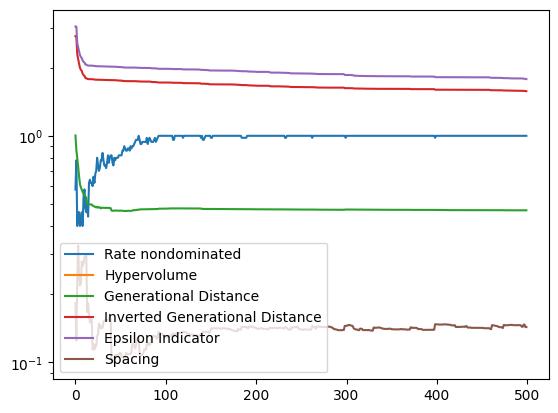

Configuración: Population size=500, Mutación=0.1, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

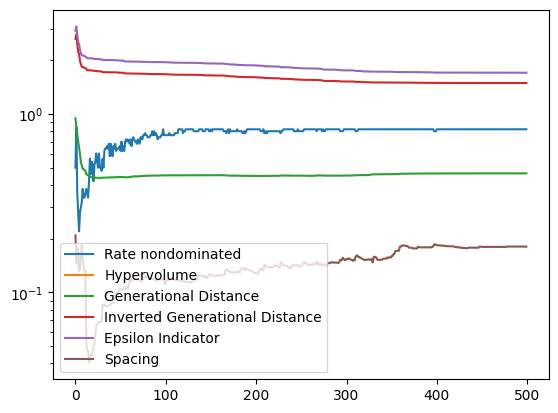

Configuración: Population size=500, Mutación=0.1, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

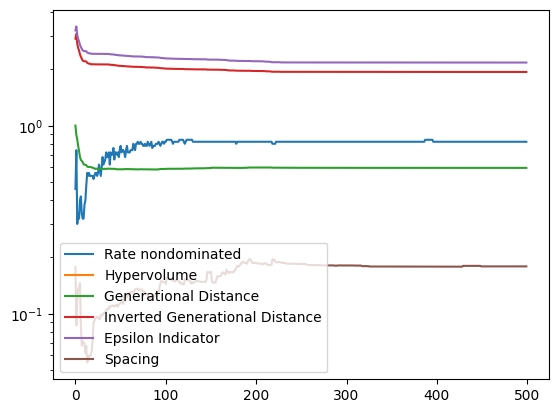

Configuración: Population size=500, Mutación=0.1, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

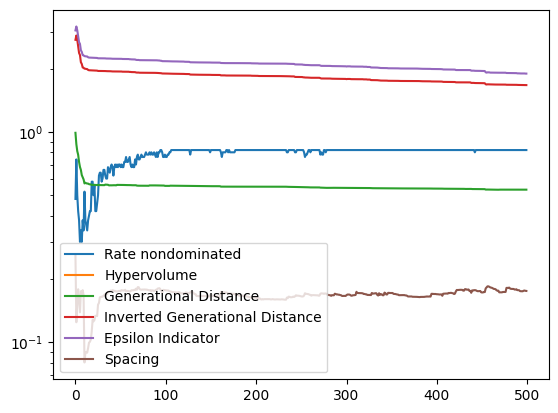

Configuración: Population size=500, Mutación=0.5, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

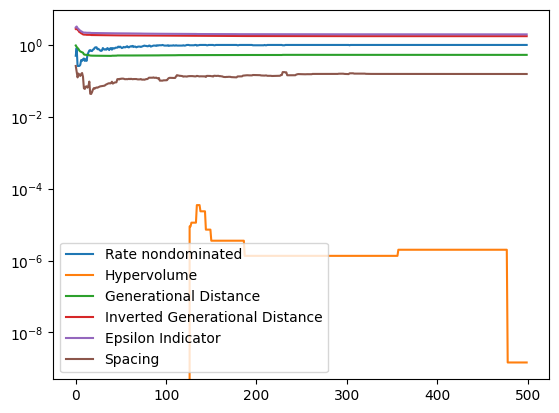

Configuración: Population size=500, Mutación=0.5, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

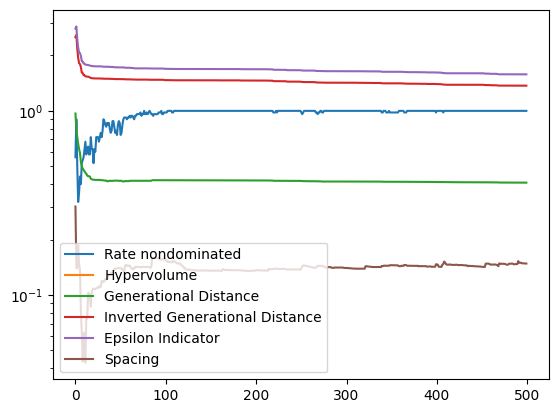

Configuración: Population size=500, Mutación=0.5, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

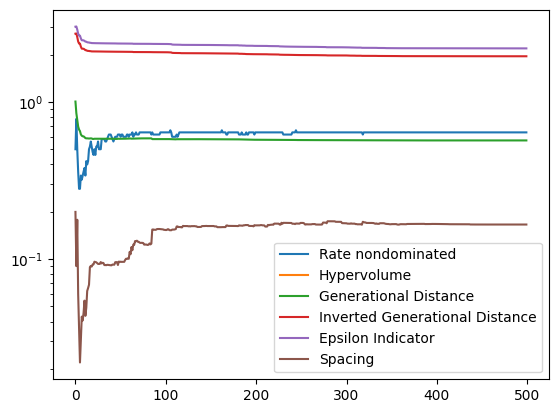

Configuración: Population size=500, Mutación=0.7, Crossover = 0.1
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

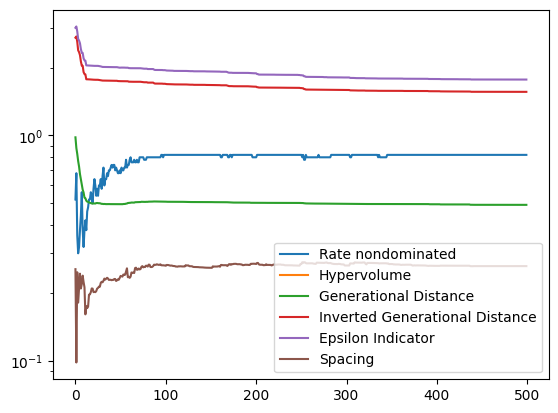

Configuración: Population size=500, Mutación=0.7, Crossover = 0.5
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

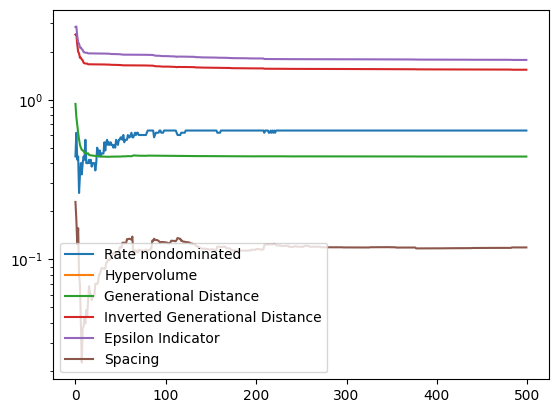

Configuración: Population size=500, Mutación=0.7, Crossover = 0.7
#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

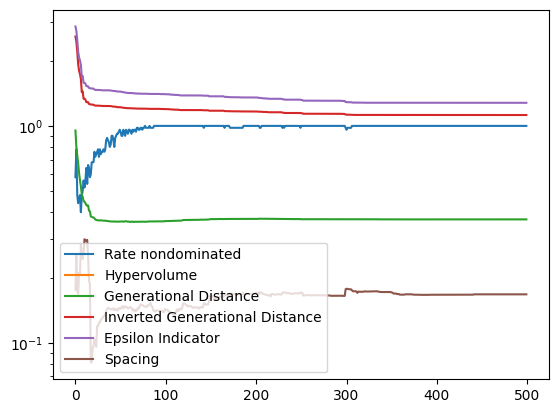

In [ ]:
import time
# Array para guardar las 5 simulaciones
n_gs = 500

res_all_sims = np.zeros((n_gs,7))

algorithms_GS = ['NSGAII', 'MOEAD']
population_size = [100, 200, 500]
mutation_prob = [0.1, 0.5, 0.7]
crossover_prob = [0.1, 0.5, 0.7]
all_configs = pd.DataFrame(columns=['population_size','mutation_prob','crossover_prob','time',
                                    'Rate nondominated','Hypervolume','Generational Distance',
                                    'Inverted Generational Distance','Epsilon Indicator','Spacing'])
t=0
all_configs

for alg in algorithms_GS:
    for pops in population_size:
        for muts in mutation_prob:
            for crosses in crossover_prob:
                print(f'Configuración: Population size={pops}, Mutación={muts}, Crossover = {crosses}')

                all_configs.loc[t, 'population_size'] = pops
                all_configs.loc[t, 'mutation_prob'] = muts
                all_configs.loc[t, 'crossover_prob'] = crosses

                time_0=time.time()

                for i in range(5):

                    if i==0:
                        res_all_sims = atm_MOEA_grid_search(name_problem='ZDT1', name_algorithm=alg, number_generations=n_gs, population_size=10, mutation_prob=0, crossover_prob=1)
                        res_all_sims = res_all_sims[:,:,np.newaxis]
                    else:
                        res_aux = atm_MOEA_grid_search(name_problem='ZDT1', name_algorithm=alg, number_generations=n_gs, population_size=10, mutation_prob=0, crossover_prob=1)
                        res_all_sims = np.concatenate((res_all_sims, res_aux[:,:,np.newaxis]), axis=2)
                        # plt.show()

                all_configs.loc[t, 'time'] = time.time() - time_0

                results = res_all_sims.mean(axis=2)

                all_configs.loc[t, 'Rate nondominated'] = results[-1,0]/results[-1,1]
                all_configs.loc[t, 'Hypervolume'] = results[-1,2]
                all_configs.loc[t, 'Generational Distance'] = results[-1,3]
                all_configs.loc[t, 'Inverted Generational Distance'] = results[-1,4]
                all_configs.loc[t, 'Epsilon Indicator'] = results[-1,5]
                all_configs.loc[t, 'Spacing'] = results[-1,6]

                t+=1

                gen = np.arange(results.shape[0])

                plt.figure()
                plt.plot(gen, results[:,0]/results[:,1], label='Rate nondominated')
                plt.plot(gen, results[:,2], label='Hypervolume')
                plt.plot(gen, results[:,3], label='Generational Distance')
                plt.plot(gen, results[:,4], label='Inverted Generational Distance')
                plt.plot(gen, results[:,5], label='Epsilon Indicator')
                plt.plot(gen, results[:,6], label='Spacing')
                plt.yscale('log')
                plt.legend()
                plt.show()

# Escribir los resultados del grid search en un csv

In [ ]:
all_configs

,population_size,mutation_prob,crossover_prob,time,Rate nondominated,Hypervolume,Generational Distance,Inverted Generational Distance,Epsilon Indicator,Spacing
0,100,0.1,0.1,95.336549,1.0,0.013075,0.281437,0.765254,0.861512,0.124418
1,100,0.1,0.5,98.45297,1.0,0.002229,0.389934,1.087224,1.23401,0.14045
2,100,0.1,0.7,102.160517,1.0,0.000838,0.343606,0.954794,1.083494,0.131648
3,100,0.5,0.1,105.780358,1.0,0.031494,0.288139,0.819983,0.924128,0.155597
4,100,0.5,0.5,103.200761,1.0,0.0,0.455988,1.281436,1.456448,0.154958
5,100,0.5,0.7,107.400528,1.0,0.00455,0.296398,0.917524,1.066783,0.109211
6,100,0.7,0.1,105.972286,1.0,0.007006,0.325293,0.905449,1.041863,0.103908
7,100,0.7,0.5,107.580244,1.0,0.000858,0.31294,0.917856,1.096191,0.122712
8,100,0.7,0.7,110.805124,1.0,0.00005,0.327972,0.904985,1.026136,0.143258
9,200,0.1,0.1,111.025471,1.0,0.002882,0.307216,0.875114,0.990734,0.139832


In [ ]:
all_configs.to_csv("all_configs.txt", sep='\t', index=False)

# Evaluación de la mejor combinación de hiperparámetros en términos de generational distance

In [28]:
results_sensitivity_analisys = pd.read_csv("all_configs.txt", sep='\t')

results_sensitivity_analisys['algorithm'] = 'NSGAII'
results_sensitivity_analisys.loc[27:, 'algorithm'] = 'MOEAD'

results_sensitivity_analisys.sort_values(by='Generational Distance')
# results_sensitivity_analisys

# NSGA_sensitivity_analisys
# MOEAD_sensitivity_analisys

,population_size,mutation_prob,crossover_prob,time,Rate nondominated,Hypervolume,Generational Distance,Inverted Generational Distance,Epsilon Indicator,Spacing,algorithm
0,100,0.1,0.1,95.336549,1.00,1.307494e-02,0.281437,0.765254,0.861512,0.124418,NSGAII
3,100,0.5,0.1,105.780358,1.00,3.149418e-02,0.288139,0.819983,0.924128,0.155597,NSGAII
5,100,0.5,0.7,107.400528,1.00,4.549937e-03,0.296398,0.917524,1.066783,0.109211,NSGAII
11,200,0.1,0.7,112.683124,1.00,5.370793e-03,0.301268,1.046390,1.213669,0.097263,NSGAII
10,200,0.1,0.5,113.727734,1.00,1.952434e-03,0.306307,0.890435,1.035023,0.117491,NSGAII
9,200,0.1,0.1,111.025471,1.00,2.882394e-03,0.307216,0.875114,0.990734,0.139832,NSGAII
22,500,0.5,0.5,130.134008,1.00,7.972284e-03,0.307358,0.881671,1.009015,0.133033,NSGAII
19,500,0.1,0.5,126.078233,1.00,3.015198e-03,0.309205,0.878914,1.012291,0.127437,NSGAII
7,100,0.7,0.5,107.580244,1.00,8.575199e-04,0.312940,0.917856,1.096191,0.122712,NSGAII
6,100,0.7,0.1,105.972286,1.00,7.005832e-03,0.325293,0.905449,1.041863,0.103908,NSGAII


In [32]:
from platypus import SBX, PM, CompoundOperator

def evaluate_results_grid_search(name_problem, name_algorithm, number_generations, population_size, mutation_prob, crossover_prob):

    folder = f'graphs/GS/{name_problem}/{name_algorithm}'
    os.makedirs(folder, exist_ok=True)

    show_results_every = 10

    # ----- Database ----------------
    problem, PF_array, PF_pltyp = problem_plus_paretofront(name_problem)

    # ----- Algorithm ---------------
    perf_so_far = InternalMetrics(reference_set=PF_pltyp)

    # ----- Variador ---------------
    # Crossover SBX
    crossover = SBX(probability=crossover_prob, distribution_index=20)

    # Mutación polinomial
    mutation = PM(probability=mutation_prob, distribution_index=20)

    # Combinarlos en un solo variador
    variator = CompoundOperator(crossover, mutation)

    if name_algorithm == 'NSGAII':
        algorithm = globals()[name_algorithm](problem, population_size=population_size, variator=variator)
    else:
        algorithm = globals()[name_algorithm](problem, population_size=population_size, variator=variator)

    # -------- Loop MO -------
    fig = plt.figure(figsize=(12,6), dpi=80)

    if problem.nobjs==2:
        ax1 = fig.add_subplot(1, 2, 1)
    elif problem.nobjs==3:
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax2 = fig.add_subplot(1, 2, 2)

    arg_ax1 ={}

    print('#####################################################')
    print(f'# Problema: {name_problem}, Algoritmo: {name_algorithm}')
    print('#####################################################')

    for ii in tqdm_notebook(range(number_generations), desc='Generation'):
        algorithm.run(1, callback=perf_so_far.calc)
        if (ii == 0) or (ii%show_results_every==0) or (ii == number_generations-1):
            sqw = np.array(perf_so_far.metrics)
            gen = np.arange(sqw.shape[0])
            # -- plot population so far and pareto front
            ax1.clear()
            if problem.nobjs==2:
                ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],marker='o',linestyle='',label='Population')
                ax1.plot(PF_array[:,0],PF_array[:,1],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
            elif problem.nobjs==3:
                ax1.plot(perf_so_far.population[ii][:,0],perf_so_far.population[ii][:,1],
                        perf_so_far.population[ii][:,2],marker='o',linestyle='',label='Population')
                ax1.plot(PF_array[:,0],PF_array[:,1],PF_array[:,2],marker='o',linestyle='',label='Pareto Front', color='r', alpha=0.1)
                ax1.set_zlabel('Objective 3')
                ax1.view_init(elev=30.0, azim=15.0)
            ax1.set_xlabel('Objective 1')
            ax1.set_ylabel('Objective 2')
            ax1.legend()
            # --- plot MO indicators ---
            ax2.clear()
            ax2.plot(gen, sqw[:,0]/sqw[:,1], label='Rate nondominated')
            ax2.plot(gen, sqw[:,2], label='Hypervolume')
            ax2.plot(gen, sqw[:,3], label='Generational Distance')
            ax2.plot(gen, sqw[:,4], label='Inverted Generational Distance')
            ax2.plot(gen, sqw[:,5], label='Epsilon Indicator')
            ax2.plot(gen, sqw[:,6], label='Spacing')

            ax2.set_xlabel('Generation')
            ax2.set_ylabel('Metric value')
            ax2.set_yscale('log')
            ax2.legend()
            fig.suptitle('Problem: %s, Algorithm: %s, nGen: %d / %d'%(name_problem, name_algorithm, ii+1, number_generations), y=0.83, fontsize=16)
            fig.tight_layout(rect=[0, -0.2, 1, 0.85])  # Añadir esta línea
            plt.savefig(fname=f'{folder}/results.pdf', bbox_inches='tight', pad_inches=0.5)  # Añade padding extra
            # plt.show()
            # fig.canvas.draw()
            # fig.canvas.flush_events()
    # return sqw

#####################################################
# Problema: ZDT1, Algoritmo: NSGAII
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

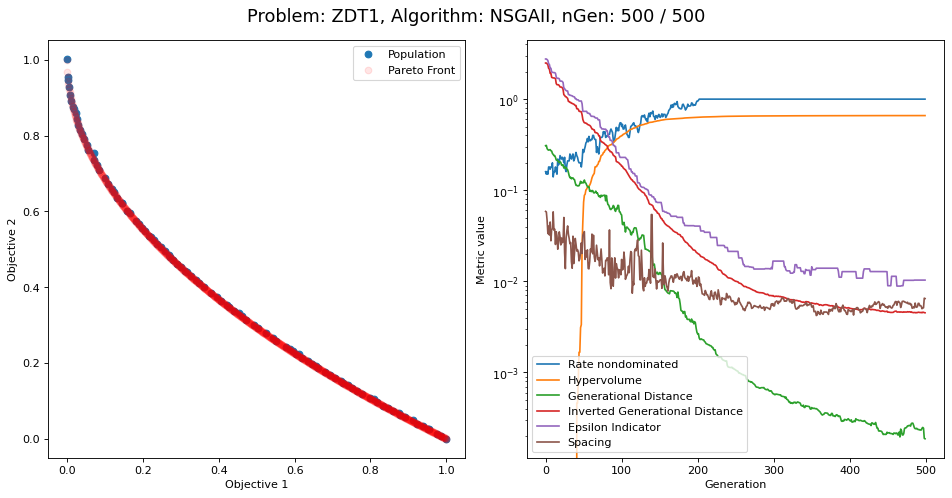

In [33]:
evaluate_results_grid_search(name_problem='ZDT1', name_algorithm='NSGAII', number_generations=500, population_size=100, mutation_prob=0.1, crossover_prob=0.1)

#####################################################
# Problema: ZDT1, Algoritmo: MOEAD
#####################################################


Generation:   0%|          | 0/500 [00:00<?, ?it/s]

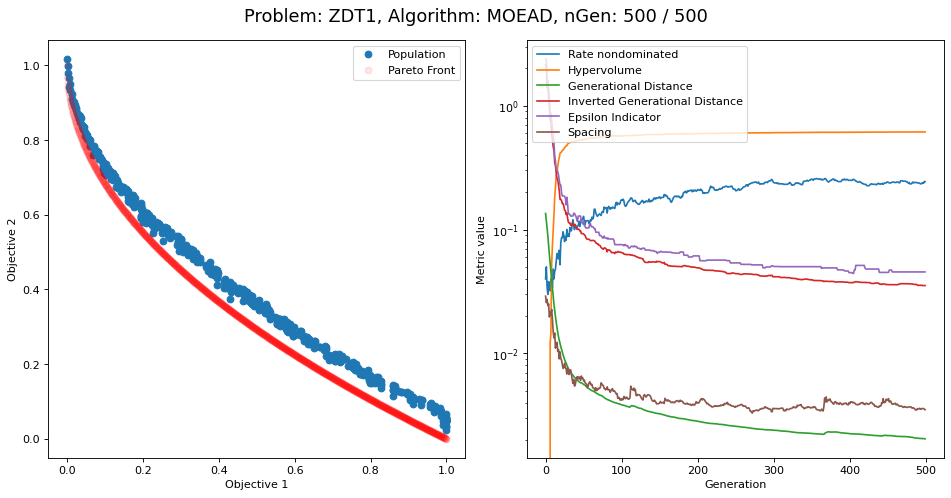

In [34]:
evaluate_results_grid_search(name_problem='ZDT1', name_algorithm='MOEAD', number_generations=500, population_size=500, mutation_prob=0.7, crossover_prob=0.7)

# Resto del código, no usado en la tarea

In [ ]:
import plotly.graph_objects as go

data = [go.Scatter(x = perf_so_far.population[0][:,0],
                   y = perf_so_far.population[0][:,1],
                   mode='markers',
                   name='Population',
                   marker_color='blue'),
        go.Scatter(x = PF_array[:,0],
                   y = PF_array[:,1],
                   mode='markers',
                   name='Pareto Front',
                   marker_color='red')]

layout=go.Layout(
        xaxis=dict(range=[0, 1], autorange=False, title='Objetive 1'),
        yaxis=dict(range=[0, 10], autorange=False, title='Objetive 2'),
        title="Start Title",
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play",
                          method="animate",
                          args=[None]),
                     dict(label="Pause",
                          method="animate",
                          args=[None,
                               {"frame": {"duration": 0, "redraw": False},
                                "mode": "immediate",
                                "transition": {"duration": 0}}],
                         )])]
    )
frames = [
    go.Frame(
        data = [go.Scatter(x = perf_so_far.population[ii][:,0],
                   y = perf_so_far.population[ii][:,1],
                   mode='markers',
                   name='Population',
                   marker_color='blue'),
        go.Scatter(x = PF_array[:,0],
                   y = PF_array[:,1],
                   mode='markers',
                   name='Pareto Front',
                   marker_color='red')]

    ) for ii in range(0,number_generations,1)]#show_results_every)]

fig = go.Figure(data=data, layout=layout, frames=frames )

# Create and add slider
steps = []
for i in range(len(fig.frames)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.frames)},
              {"title": "Slider switched to step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

# fig.update_layout(sliders=[{"steps": [{"args": [
#                                         [f],
#                                         {"frame": {"duration": 0, "redraw": False},
#                                          "mode": "immediate",
#                                          "transition": {"duration": 300}},
#                                     ],
#                              "label": f, "method": "animate", }
#                             for f in range(0,number_generations,1)]}],)

fig.show()

In [ ]:
len(fig.frames)

100

***
## Evaluación en paralelo de varios algoritmos multi-objetivos

> **Nota:** Parámetro nfe es el número de evaluaciones que realiza cada algoritmo, no el número de generaciones de evolución

In [ ]:
!pip install six

/content/drive/MyDrive/python/EL7037(2025.2)_T2_MO/utils_platypus.py:64: PlatypusWarning:

Avoid assigning attribute 'objectives' directly, use indices 'objectives[:]=...' instead



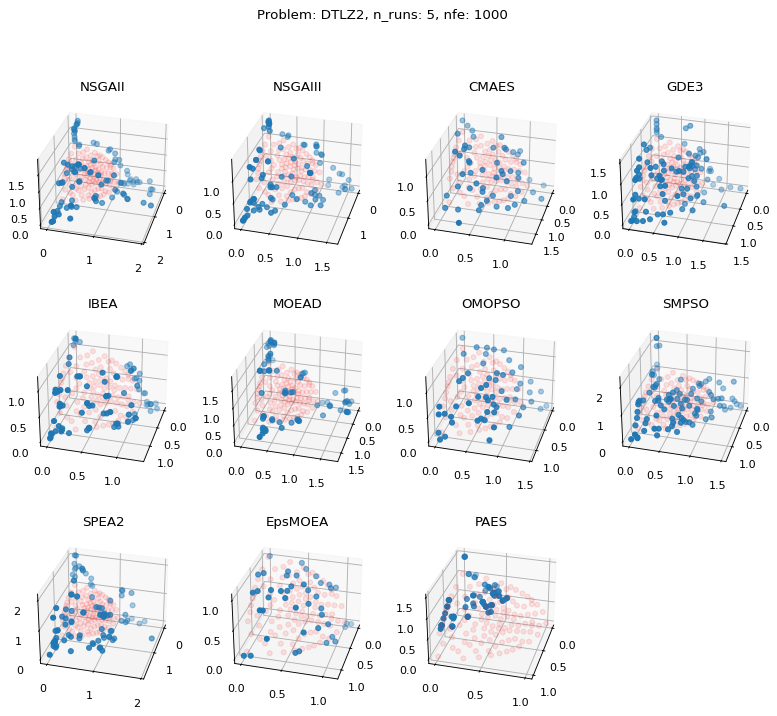

In [ ]:
import six

name_problem = "DTLZ2"
# name_problem = 'ZDT1'

nfe = 1000  #number of function evaluations
seed = 5 # number of replicates of each experiment

# ----- Database ----------------
problem, PF_array, _ = problem_plus_paretofront(name_problem)

algorithms = [ NSGAII,
              (NSGAIII, {"divisions_outer":12}),
              (CMAES, {"epsilons":[0.05]}),
               GDE3,
               IBEA,
              (MOEAD, {"weight_generator":normal_boundary_weights, "divisions_outer":12}),
              (OMOPSO, {"epsilons":[0.05]}),
               SMPSO,
               SPEA2,
              (EpsMOEA, {"epsilons":[0.05]}),
               PAES]
# Warning: problem with PESA2 algorithm

# run the experiment using Python 3's concurrent futures for parallel evaluation
with ProcessPoolEvaluator() as evaluator:
    results = experiment(algorithms, problem, seeds=seed, nfe=nfe, evaluator=evaluator)

# display the results
fig = plt.figure(figsize=(12,10), dpi=80)

for i, algorithm in enumerate(six.iterkeys(results)):
    result = results[algorithm][name_problem][0]

    if problem.nobjs==2:
        ax = fig.add_subplot(3, 4, i+1)
        ax.scatter([s.objectives[0] for s in result],
                   [s.objectives[1] for s in result])
        ax.scatter(PF_array[:,0],PF_array[:,1],c='r',alpha=.1)
    elif problem.nobjs==3:
        ax = fig.add_subplot(3, 4, i+1, projection='3d')
        ax.scatter([s.objectives[0] for s in result],
                   [s.objectives[1] for s in result],
                   [s.objectives[2] for s in result])
        ax.scatter(PF_array[:,0], PF_array[:,1], PF_array[:,2],c='r',alpha=.1)
#         ax.set_zlim([0, 1.1])
        ax.view_init(elev=30.0, azim=15.0)
    ax.set_title(algorithm)
#     ax.set_xlim([0, 1.1])
#     ax.set_ylim([0, 1.1])
    ax.locator_params(nbins=4)
fig.suptitle('Problem: %s, n_runs: %d, nfe: %d'%(name_problem, seed, nfe))
plt.show()